# Dependencies

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import joblib

In [59]:
import warnings
warnings.filterwarnings('ignore')

# Data Load

In [60]:
# Importing the pandas library and reading the CSV file 'Zephyr Data Emo with new categories-Copy1.csv'
# The 'engine' parameter is set to 'python' to handle non-default delimiter options.
# The 'delimiter' parameter is set to ';' to specify that the data in the CSV file is delimited by semicolons.

raw_core = pd.read_csv('Zephyr Data Emo with new categories.csv', engine='python', delimiter=';')


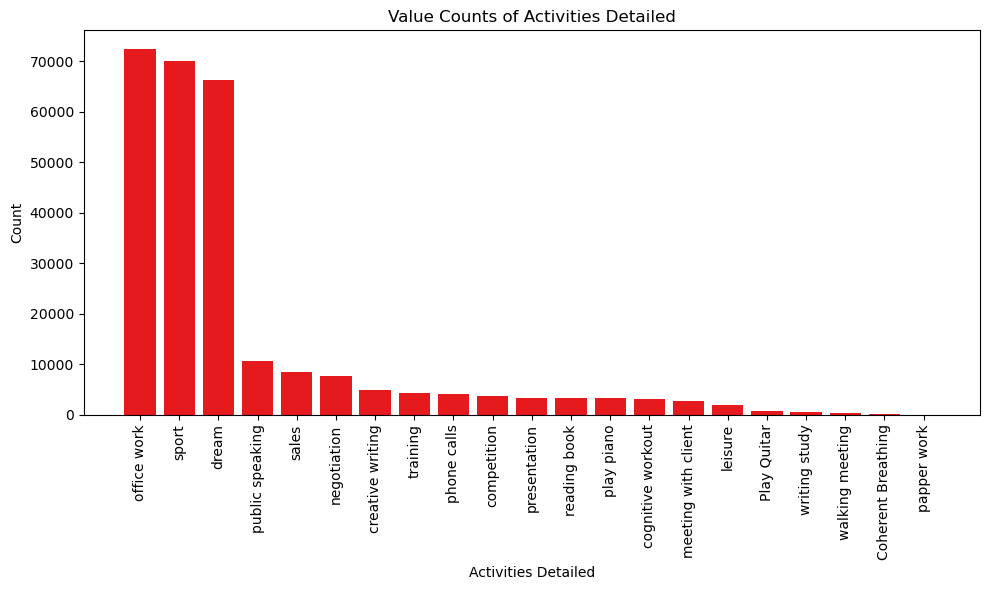

In [61]:
# Get the value counts for the 'Activities Detailed' column
value_counts = raw_core['Activities Detailed'].value_counts()

# Create the bar plot
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size if needed
plt.bar(value_counts.index, value_counts.values)

# Optional: Rotate the x-axis labels if they are too long
plt.xticks(rotation=90)

# Optional: Add labels and title
plt.xlabel('Activities Detailed')
plt.ylabel('Count')
plt.title('Value Counts of Activities Detailed')

# Show the plot
plt.tight_layout()  # Optional: To avoid cutoff of labels
plt.show()

In [62]:

# Creating a new DataFrame 'raw' by filtering out rows where the 'Activities Detailed' column is not equal to 'papper work'.
# This step is essentially excluding rows with the value 'papper work' in the 'Activities Detailed' column which has only 1 entry.
raw = raw_core[raw_core['Activities Detailed'] != 'papper work']


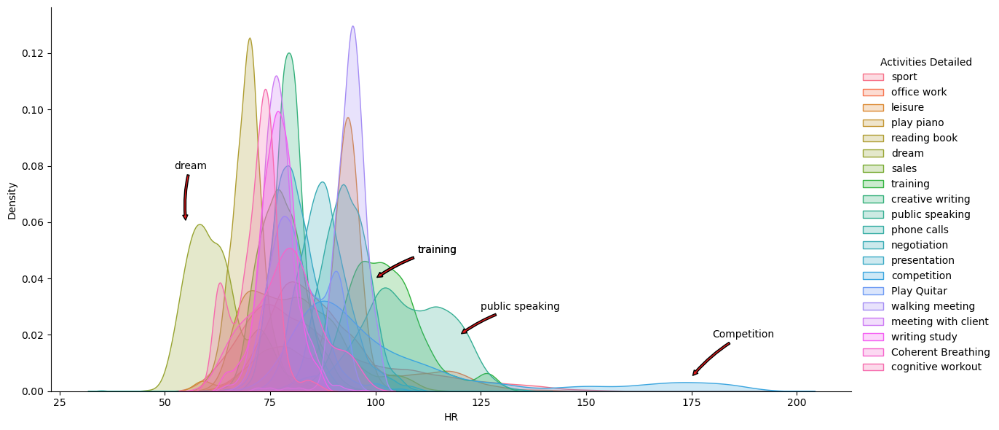

In [63]:
sns.set_palette("Set1", desat=1)

# Create a FacetGrid
facetgrid = sns.FacetGrid(raw, hue='Activities Detailed', height=6, aspect=2)

# Map the distribution plot
facetgrid.map(sns.kdeplot, 'HR', fill=True)

# Add legend
facetgrid.add_legend()

# Annotations
plt.annotate("dream", xy=(55, 0.06), xytext=(60, 0.08),
             xycoords='data', textcoords='data',
             va='center', ha='right',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("Competition", xy=(175, 0.005), xytext=(180, 0.02),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("training", xy=(100, 0.04), xytext=(110, 0.05),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("training", xy=(100, 0.04), xytext=(110, 0.05),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("public speaking", xy=(120, 0.02), xytext=(125, 0.03),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

# Show the plot
plt.show()

In [64]:
# Assuming 'raw' is a DataFrame containing the data.

# Extracting the 'Activities Detailed' column and assigning it to the 'y' variable.
y = raw[['Activities Detailed']]

# Creating a new DataFrame 'X' by dropping the 'Activities Detailed' and 'Activities' columns from the original DataFrame 'raw'.
# 'X' will contain the remaining features (columns) of the data.
X = raw.drop(columns=['Activities Detailed', 'Activities'])


# Data Prep

## Data Split

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, stratify = y)

## Initial Data Cleaning

In [66]:
class DataCleanerTransformer:
    def __init__(self):
        # Define the columns that need to be converted to float
        self.float_columns = ['Activity', 'PeakAcceleration', 'ECGAmplitude', 'ECGNoise', 'CoreTemp',
                              'AvStepPeriod', 'AvForceDevRate', 'AvStepImpulse']
        
    def fit(self, data):
        # Nothing to fit in this case, so we return self.
        return self

    def transform(self, data):
        # Convert selected columns to float
        data[self.float_columns] = data[self.float_columns].apply(lambda x: x.str.replace(',', '.').astype(float))

        # Convert 'Time' column to pandas datetime format
        data['Time_New'] = pd.to_datetime(data['Time'], format="%d.%m.%Y %H:%M:%S")

        # Fill NaN values with 0
        data = data.fillna(0)
        
        return data

    def fit_transform(self, data):
        # Fit the transformer (in this case, there's nothing to fit)
        self.fit(data)

        # Transform the data using the transform method
        return self.transform(data)


# Example usage:
# Instantiate the DataCleanerTransformer class
data_cleaner = DataCleanerTransformer()

X_train_loaded = data_cleaner.fit_transform(X_train)

## Data Reduction

In [67]:
drop = [
        #The model overfits and remmember when what activities were done so they are removed
        'Year', 'Month', 'Weekday', 'Time', 'Time_New','Date','Hour',
    
        #We have few participants so the model is good at overfitting who did what
        'Name of the volunteer',
        
        #These are health KPIs of how the Holter machine works and aren't dependant on activity.
        'BRAmplitude','ECGAmplitude', 'HRConfidence',
        
        #These measure how the machine works and whether it detects noise. This is what we model.
        'ECGNoise','Jumps','JumpFlightTime'
    
        #Stress is mannualy inputted
#         ,'Controled stress',' stress', 'Before Controled stress', 'After controlled stress'
       ]

In [68]:
X_preprocessed = X_train_loaded.drop(columns = drop)

## Data Exploration

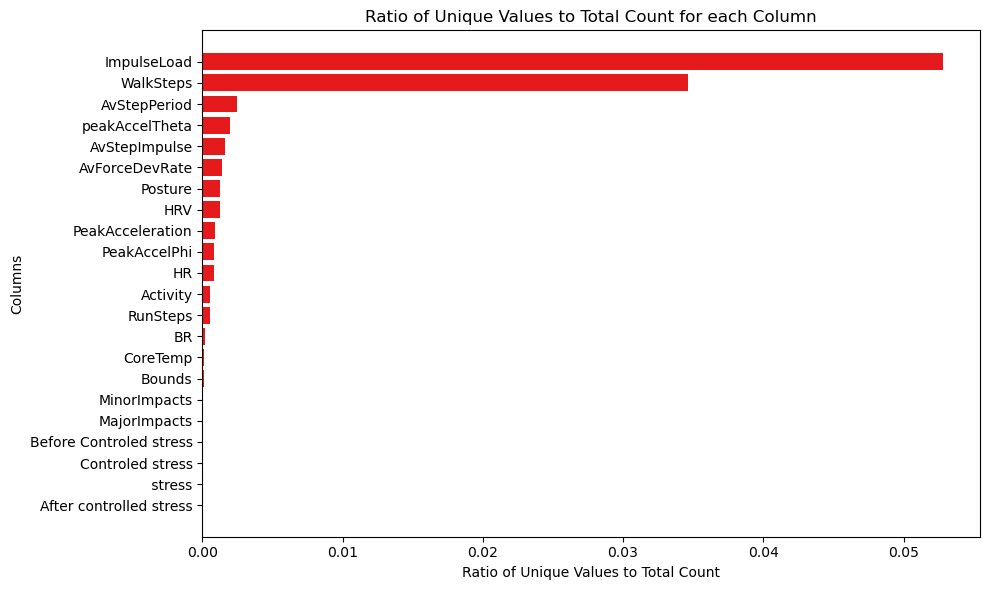

In [69]:
ratios = (X_preprocessed.nunique() / X_preprocessed.count()).sort_values(ascending=True)

# Create a bar plot to visualize the ratios
plt.figure(figsize=(10, 6))
plt.barh(ratios.index, ratios.values)
plt.xlabel('Ratio of Unique Values to Total Count')
plt.ylabel('Columns')
plt.title('Ratio of Unique Values to Total Count for each Column')
plt.tight_layout()
plt.show()

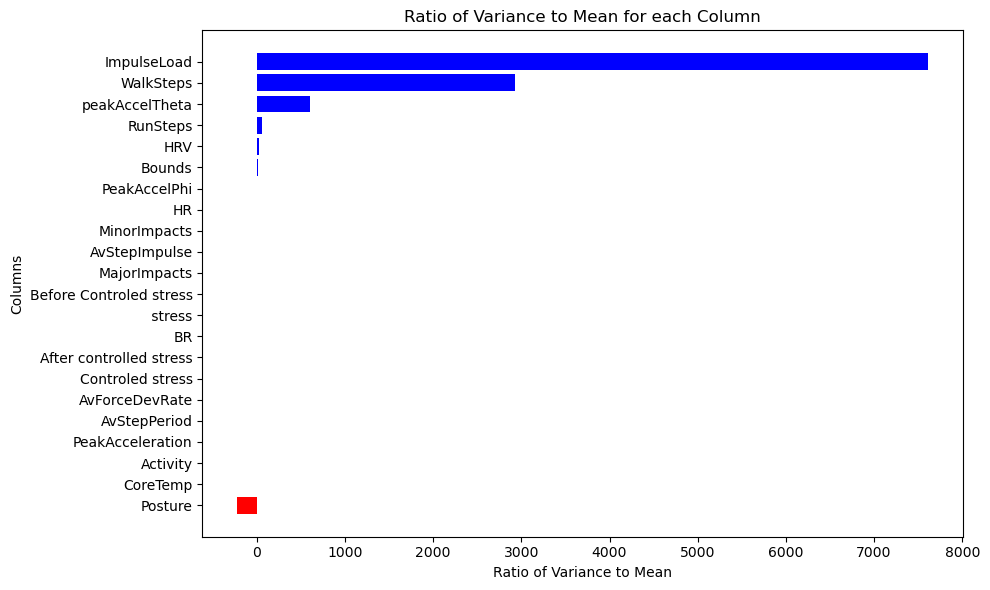

In [70]:
import matplotlib.pyplot as plt

# Assuming you have already calculated the ratio of variance to mean
ratios = (X_preprocessed.var() / X_preprocessed.mean()).sort_values(ascending=True)

# Create a bar plot to visualize the ratios
plt.figure(figsize=(10, 6))

# Color negative values in red, and non-negative values in the default color (blue)
colors = ['red' if value < 0 else 'blue' for value in ratios.values]

plt.barh(ratios.index, ratios.values, color=colors)
plt.xlabel('Ratio of Variance to Mean')
plt.ylabel('Columns')
plt.title('Ratio of Variance to Mean for each Column')
plt.tight_layout()
plt.show()


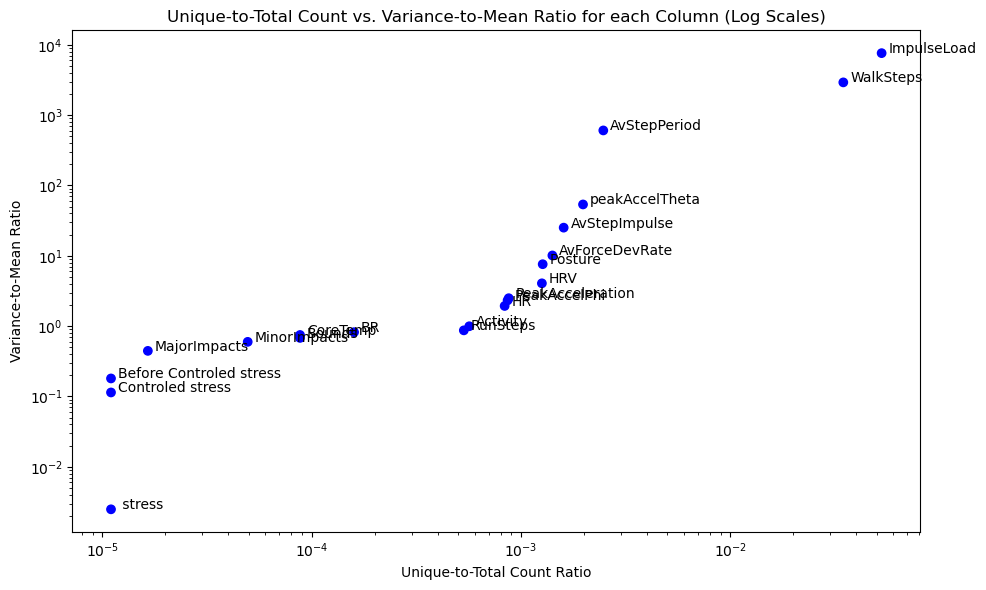

In [71]:
import matplotlib.pyplot as plt

# Assuming you have already calculated the ratio of unique values to total count and variance to mean
unique_ratios = (X_preprocessed.nunique() / X_preprocessed.count()).sort_values(ascending=True)
variance_ratios = (X_preprocessed.var() / X_preprocessed.mean()).sort_values(ascending=True)

# Create a scatter plot to combine the two ratios
plt.figure(figsize=(10, 6))


# Plot the scatter plot with unique-to-total count ratios on the x-axis and variance-to-mean ratios on the y-axis
plt.scatter(unique_ratios.values, variance_ratios.values, color=colors)

# Annotate each point with the column name next to the data point
for i, col in enumerate(unique_ratios.index):
    plt.annotate(col, xy=(unique_ratios.values[i], variance_ratios.values[i]),
                 xytext=(5, 0), textcoords='offset points')

# Set log scales for both x and y axes
plt.xscale('log')
plt.yscale('log')

plt.xlabel('Unique-to-Total Count Ratio')
plt.ylabel('Variance-to-Mean Ratio')
plt.title('Unique-to-Total Count vs. Variance-to-Mean Ratio for each Column (Log Scales)')
plt.tight_layout()

plt.show()


## Non Zero transformer

In [72]:
class AnyGreaterThanZeroTransformer:
    def __init__(self, columns, c_name):
        
        self.columns = columns
        self.c_name = c_name
        
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Concatenate the names of the specified columns into a new column
        X[f'{self.c_name}'] =   (X[self.columns] > 0).any(axis=1).astype(int)

        # Drop the original specified columns as they are no longer needed
        X.drop(columns=self.columns, inplace=True)

        return X

    def fit_transform(self, X, y=None):
        return self.fit(X).transform(X)

In [73]:
X_non_binary = X_preprocessed.copy()

### Stress

<Figure size 1000x600 with 0 Axes>

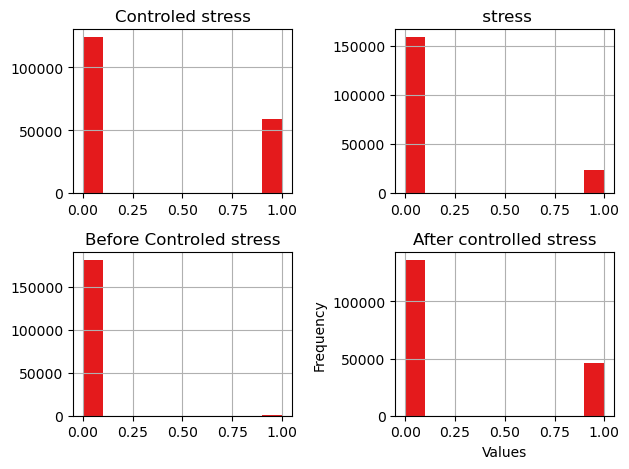

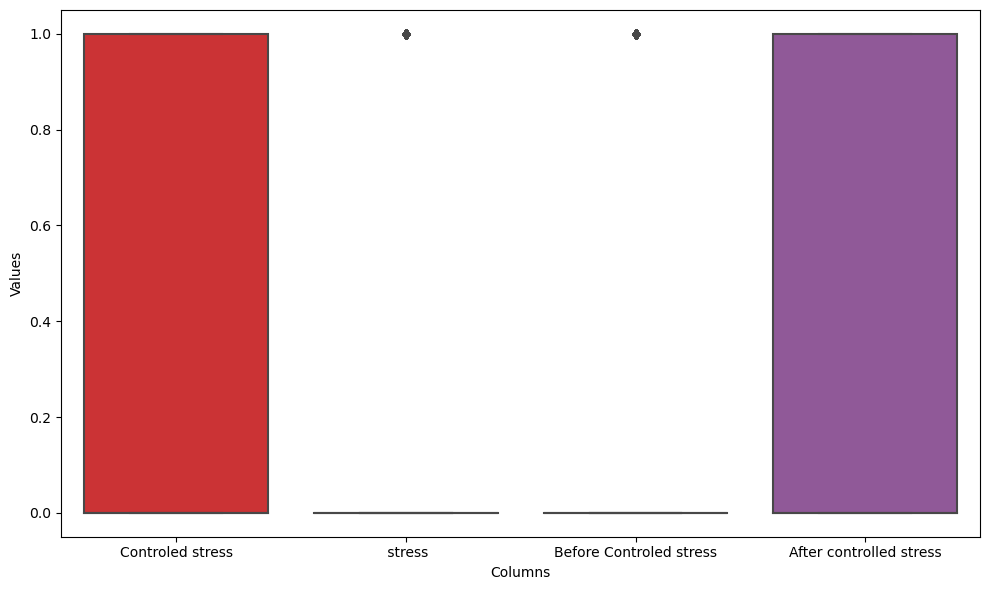

In [74]:
# Plot histograms for the specified columns
plt.figure(figsize=(10, 6))
X_preprocessed.hist(column=['Controled stress', ' stress', 'Before Controled stress', 'After controlled stress'], bins=10)
plt.xlabel('Values')
plt.ylabel('Frequency')
# plt.title('Histograms for the Specified Columns')
plt.tight_layout()
plt.show()

# Plot boxplots for the specified columns
plt.figure(figsize=(10, 6))
sns.boxplot(data=X_preprocessed[['Controled stress', ' stress', 'Before Controled stress', 'After controlled stress']])
plt.xlabel('Columns')
plt.ylabel('Values')
# plt.title('Boxplots for the Specified Columns')
plt.tight_layout()
plt.show()

In [75]:
# Use the fit_transform method to create the new column 'AnyGreaterThanZero'
Stress_Data = X_non_binary.copy()
Stress_Data = AnyGreaterThanZeroTransformer(columns=['Controled stress',' stress', 'Before Controled stress', 'After controlled stress'],
                                            c_name = 'Stress_Binary')\
                                            .fit_transform(X_non_binary)

### Impact

<Figure size 1000x600 with 0 Axes>

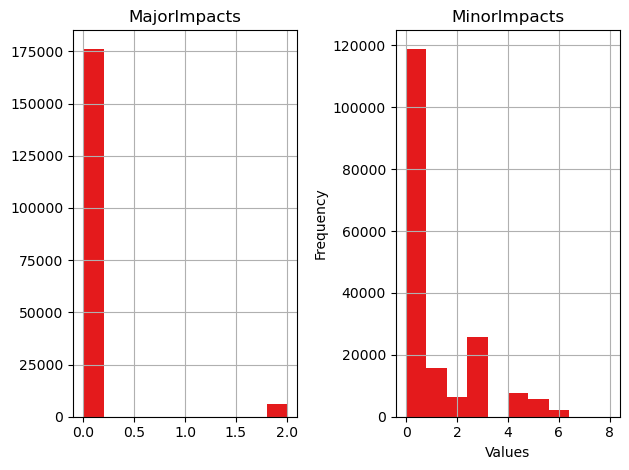

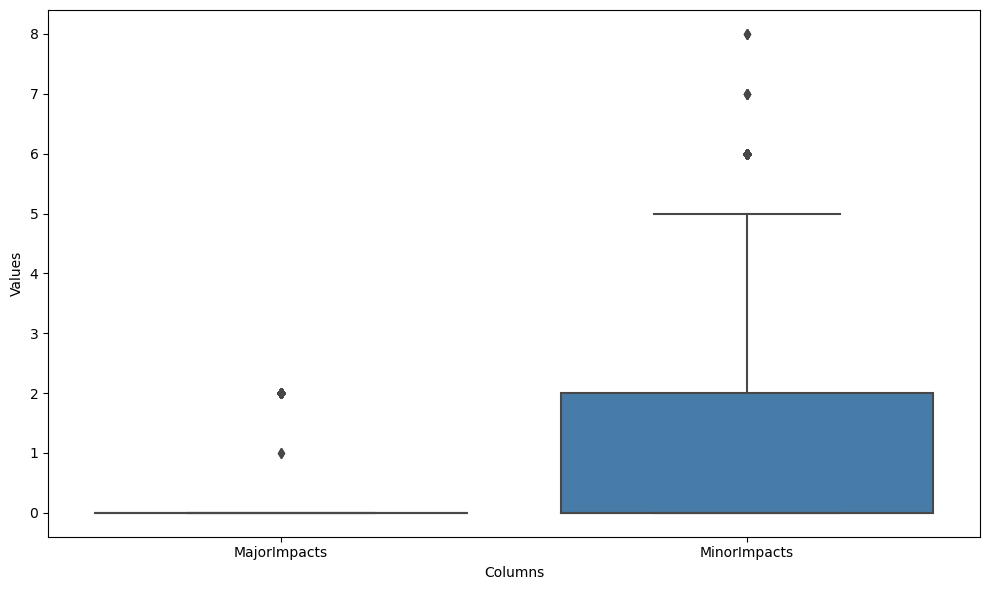

In [76]:
# Plot histograms for the specified columns
plt.figure(figsize=(10, 6))
X_preprocessed.hist(column=['MajorImpacts','MinorImpacts'], bins=10)
plt.xlabel('Values')
plt.ylabel('Frequency')
# plt.title('Histograms for the Specified Columns')
plt.tight_layout()
plt.show()

# Plot boxplots for the specified columns
plt.figure(figsize=(10, 6))
sns.boxplot(data=X_preprocessed[['MajorImpacts','MinorImpacts']])
plt.xlabel('Columns')
plt.ylabel('Values')
# plt.title('Boxplots for the Specified Columns')
plt.tight_layout()
plt.show()

In [77]:
Impact_Data = AnyGreaterThanZeroTransformer(columns=['MajorImpacts','MinorImpacts']
                                           ,c_name = 'Impact_Binary')\
                                            .fit_transform(Stress_Data)

### Av* Data

<Figure size 1000x600 with 0 Axes>

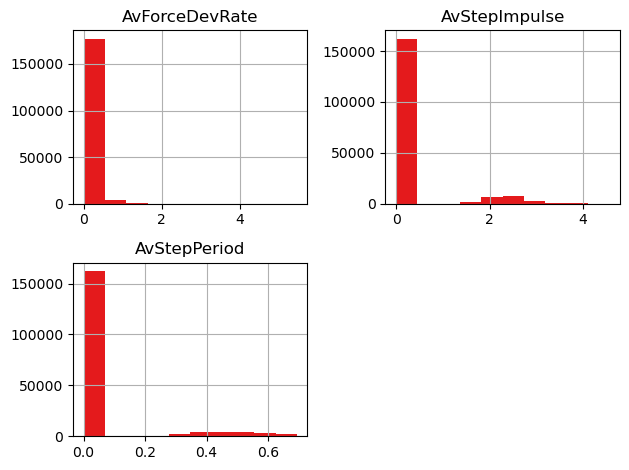

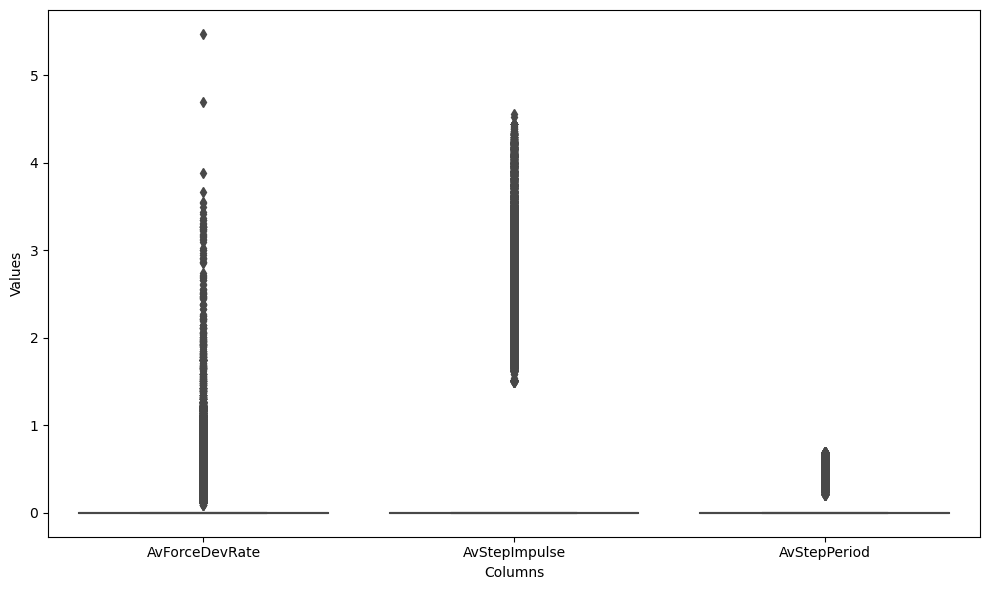

In [78]:
# Plot histograms for the specified columns
plt.figure(figsize=(10, 6))
X_preprocessed.hist(column=['AvForceDevRate', 'AvStepImpulse', 'AvStepPeriod'], bins=10)
plt.xlabel('Values')
plt.ylabel('Frequency')
# plt.title('Histograms for the Specified Columns')
plt.tight_layout()
plt.show()

# Plot boxplots for the specified columns
plt.figure(figsize=(10, 6))
sns.boxplot(data=X_preprocessed[['AvForceDevRate', 'AvStepImpulse', 'AvStepPeriod']])
plt.xlabel('Columns')
plt.ylabel('Values')
# plt.title('Boxplots for the Specified Columns')
plt.tight_layout()
plt.show()

In [79]:
Av_Data = AnyGreaterThanZeroTransformer(columns=['AvForceDevRate', 'AvStepImpulse', 'AvStepPeriod']
                                           ,c_name = 'Av_Binary')\
                                            .fit_transform(Stress_Data)

### Peak Data

<Figure size 1000x600 with 0 Axes>

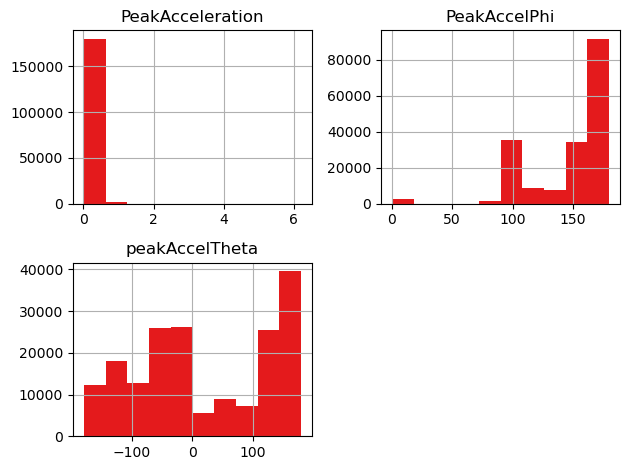

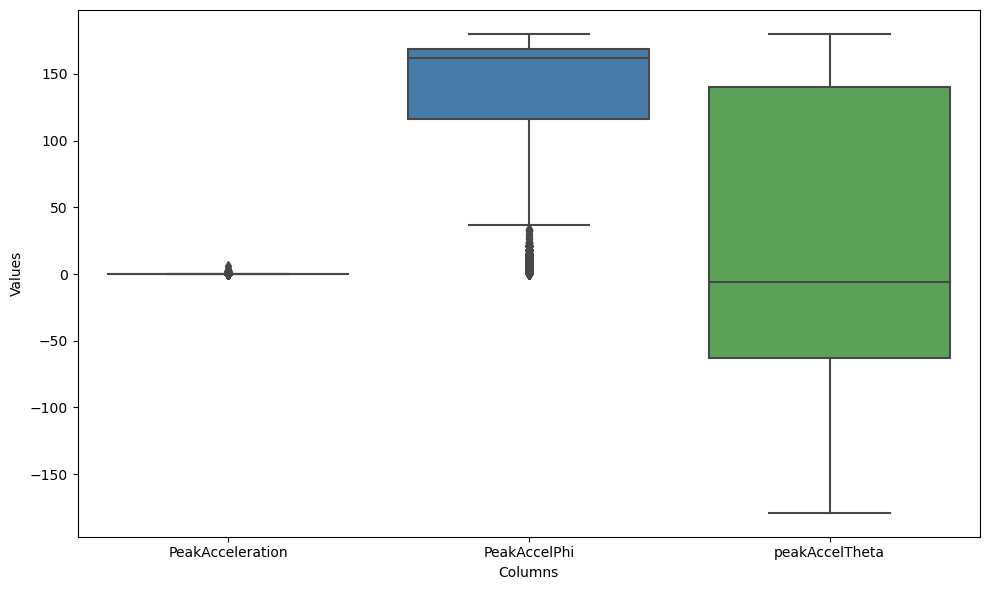

In [80]:
# Plot histograms for the specified columns
plt.figure(figsize=(10, 6))
X_preprocessed.hist(column=['PeakAcceleration', 'PeakAccelPhi', 'peakAccelTheta'], bins=10)
plt.xlabel('Values')
plt.ylabel('Frequency')
# plt.title('Histograms for the Specified Columns')
plt.tight_layout()
plt.show()

# Plot boxplots for the specified columns
plt.figure(figsize=(10, 6))
sns.boxplot(data=X_preprocessed[['PeakAcceleration', 'PeakAccelPhi', 'peakAccelTheta']])
plt.xlabel('Columns')
plt.ylabel('Values')
# plt.title('Boxplots for the Specified Columns')
plt.tight_layout()
plt.show()

In [81]:
Accel_Data = AnyGreaterThanZeroTransformer(columns=['PeakAcceleration']
                                           ,c_name = 'Acc_Binary')\
                                            .fit_transform(Stress_Data)

### Bounds

<Figure size 1000x600 with 0 Axes>

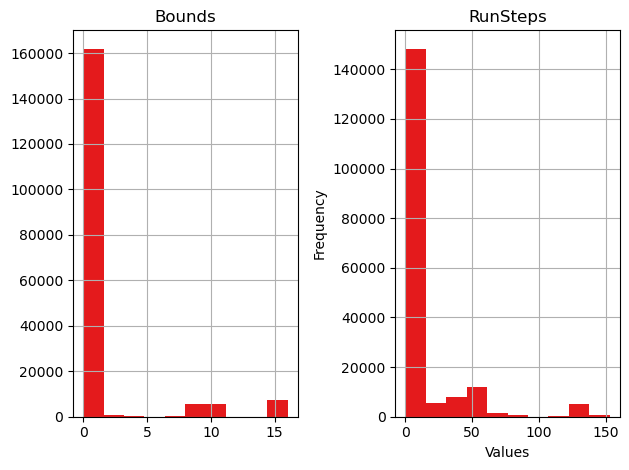

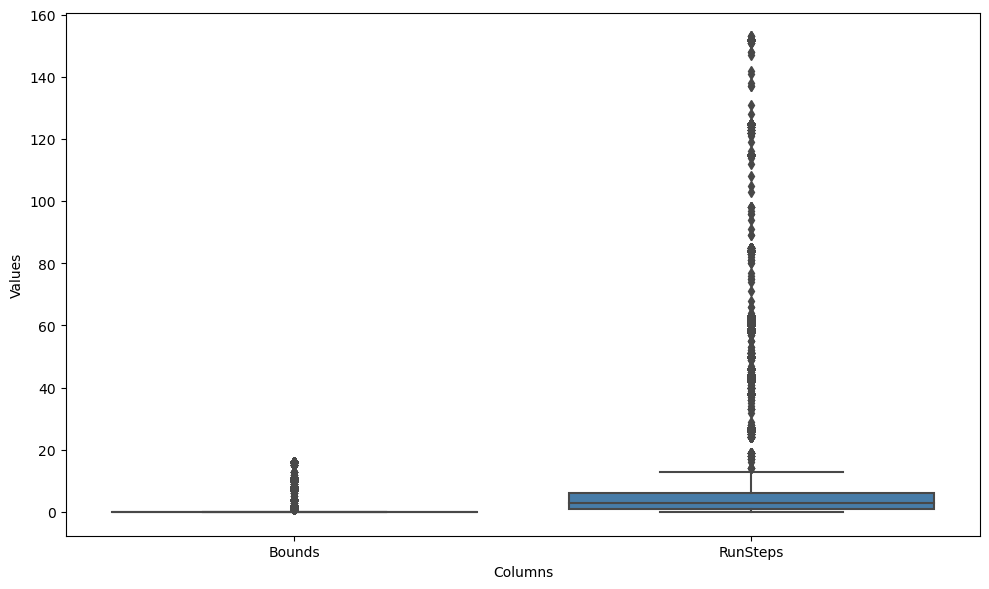

In [82]:
# Plot histograms for the specified columns
plt.figure(figsize=(10, 6))
X_preprocessed.hist(column=['Bounds', 'RunSteps'], bins=10)
plt.xlabel('Values')
plt.ylabel('Frequency')
# plt.title('Histograms for the Specified Columns')
plt.tight_layout()
plt.show()

# Plot boxplots for the specified columns
plt.figure(figsize=(10, 6))
sns.boxplot(data=X_preprocessed[['Bounds', 'RunSteps']])
plt.xlabel('Columns')
plt.ylabel('Values')
# plt.title('Boxplots for the Specified Columns')
plt.tight_layout()
plt.show()

In [83]:
Bounds_Data = AnyGreaterThanZeroTransformer(columns=['Bounds']
                                           ,c_name = 'Bounds_Binary')\
                                            .fit_transform(Stress_Data)

## Data Cleaning

In [84]:
X_train_outlier = Bounds_Data.copy()

In [85]:
# Identify non-binary columns
non_binary_columns = X_train_outlier.columns[X_train_outlier.nunique() > 2]
binary_clumns = X_train_outlier.drop(columns = non_binary_columns).columns.tolist()

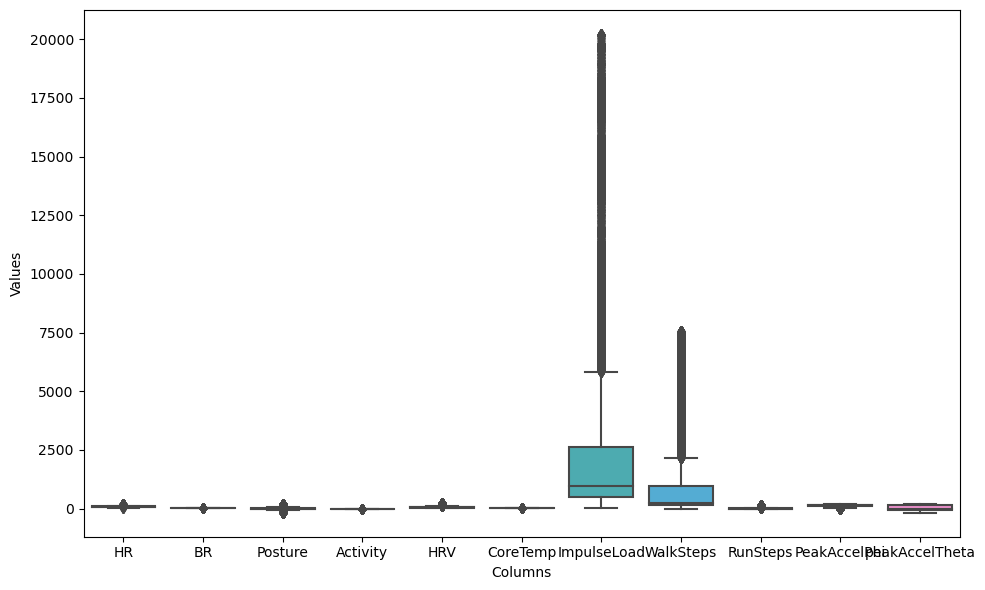

In [86]:
# Plot boxplots for the specified columns
plt.figure(figsize=(10, 6))
sns.boxplot(data=X_train_outlier[non_binary_columns])
plt.xlabel('Columns')
plt.ylabel('Values')
# plt.title('Boxplots for the Specified Columns')
plt.tight_layout()
plt.show()

### Outlier Replacer

In [87]:
class OutlierReplacer:
    def __init__(self, columns):
        self.columns = columns
        self.iqr_ranges = {}

    def fit(self, X, y=None):
        for column in self.columns:
            Q1 = X[column].quantile(0.25)
            Q3 = X[column].quantile(0.75)
            IQR = Q3 - Q1
            self.iqr_ranges[column] = (Q1 - 1.5 * IQR, Q3 + 1.5 * IQR)

        return self

    def transform(self, X):
        X_transformed = X.copy()

        for column in self.columns:
            if column in self.iqr_ranges:
                outliers = (X_transformed[column] < self.iqr_ranges[column][0]) | (X_transformed[column] > self.iqr_ranges[column][1])
                detected_outliers = X_transformed[outliers]

                clean_data_iqr = X_transformed[~outliers].fillna(0)

                mean_value = clean_data_iqr[column].mean()
                noise = np.random.normal(0, 0.1, len(detected_outliers))
                mean_value_with_noise = noise + mean_value

                X_transformed.loc[outliers, column] = mean_value_with_noise

        return X_transformed

    def fit_transform(self, X, y=None):
        return self.fit(X).transform(X)

In [88]:
# Instantiate the OutlierReplacer class and fit_transform on training data
outlier_replacer = OutlierReplacer(columns=non_binary_columns).fit(X_train_outlier)

X_train_less_outliers = outlier_replacer.transform(X_train_outlier)


## Scaler

In [89]:
scaler = StandardScaler().fit(X_train_less_outliers)

In [90]:
# Make a copy of the original DataFrame
X_train_scaled = X_train_less_outliers.copy()

# Instantiate the StandardScaler with the selected columns and fit and transform them
scaler = StandardScaler().fit(X_train_less_outliers[non_binary_columns])

X_train_scaled[non_binary_columns] = scaler.transform(X_train_less_outliers[non_binary_columns])


## Label Encoder

In [91]:
label_encoder = LabelEncoder().fit(y_train)

In [92]:
y_train['Target'] = label_encoder.transform(y_train)

In [93]:
y_train_target = y_train[['Target']]

In [94]:
y_train

,Activities Detailed,Target
194779,sport,16
144310,dream,5
220145,sport,16
141697,dream,5
214535,sport,16
...,...,...
49582,sport,16
173083,presentation,12
15965,office work,9
43886,sport,16


# Similarity Analysis

## t-SNE

In [95]:
from sklearn.manifold import TSNE
import matplotlib.patheffects as PathEffects
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min

In [ ]:
# Assuming you have a DataFrame named 'X_pre_tsne' and you want to select 'n' random rows per label
n = 1000  # Number of random rows per label

# Group the dataframe by the 'Activities Detailed' column
grouped = non_binary_columns.groupby('Activities Detailed')

# Create an empty DataFrame to store the subdataframe
subdataframe = pd.DataFrame()

# Iterate over each group
for label, group_df in grouped:
    # Get the number of available rows for the current label
    available_rows = len(group_df)

    # Calculate the number of rows to sample (min between 'n' and available rows)
    rows_to_sample = min(n, available_rows)

    # Randomly sample rows from the current group
    random_rows = group_df.sample(rows_to_sample, replace=rows_to_sample > available_rows, random_state=42)

    # Replicate rows if necessary
    if rows_to_sample > available_rows:
        repetitions = rows_to_sample // available_rows
        random_rows = pd.concat([random_rows] * repetitions, ignore_index=True)
        remaining_rows = rows_to_sample % available_rows
        random_rows = pd.concat([random_rows, group_df.sample(remaining_rows, random_state=42)], ignore_index=True)

    # Append the random rows to the subdataframe
    subdataframe = pd.concat([subdataframe, random_rows], ignore_index=True)

# Reset the index of the subdataframe
subdataframe = subdataframe.reset_index(drop=True)

In [96]:
perplexity, n_iter = 50,1000
X_reduced = TSNE(verbose=2, perplexity=perplexity).fit_transform(X_train_scaled)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 182103 samples in 0.009s...
[t-SNE] Computed neighbors for 182103 samples in 48.983s...
[t-SNE] Computed conditional probabilities for sample 1000 / 182103
[t-SNE] Computed conditional probabilities for sample 2000 / 182103
[t-SNE] Computed conditional probabilities for sample 3000 / 182103
[t-SNE] Computed conditional probabilities for sample 4000 / 182103
[t-SNE] Computed conditional probabilities for sample 5000 / 182103
[t-SNE] Computed conditional probabilities for sample 6000 / 182103
[t-SNE] Computed conditional probabilities for sample 7000 / 182103
[t-SNE] Computed conditional probabilities for sample 8000 / 182103
[t-SNE] Computed conditional probabilities for sample 9000 / 182103
[t-SNE] Computed conditional probabilities for sample 10000 / 182103
[t-SNE] Computed conditional probabilities for sample 11000 / 182103
[t-SNE] Computed conditional probabilities for sample 12000 / 182103
[t-SNE] Computed conditional proba

[t-SNE] Computed conditional probabilities for sample 128000 / 182103
[t-SNE] Computed conditional probabilities for sample 129000 / 182103
[t-SNE] Computed conditional probabilities for sample 130000 / 182103
[t-SNE] Computed conditional probabilities for sample 131000 / 182103
[t-SNE] Computed conditional probabilities for sample 132000 / 182103
[t-SNE] Computed conditional probabilities for sample 133000 / 182103
[t-SNE] Computed conditional probabilities for sample 134000 / 182103
[t-SNE] Computed conditional probabilities for sample 135000 / 182103
[t-SNE] Computed conditional probabilities for sample 136000 / 182103
[t-SNE] Computed conditional probabilities for sample 137000 / 182103
[t-SNE] Computed conditional probabilities for sample 138000 / 182103
[t-SNE] Computed conditional probabilities for sample 139000 / 182103
[t-SNE] Computed conditional probabilities for sample 140000 / 182103
[t-SNE] Computed conditional probabilities for sample 141000 / 182103
[t-SNE] Computed con

Creating plot for this t-SNE visualization..


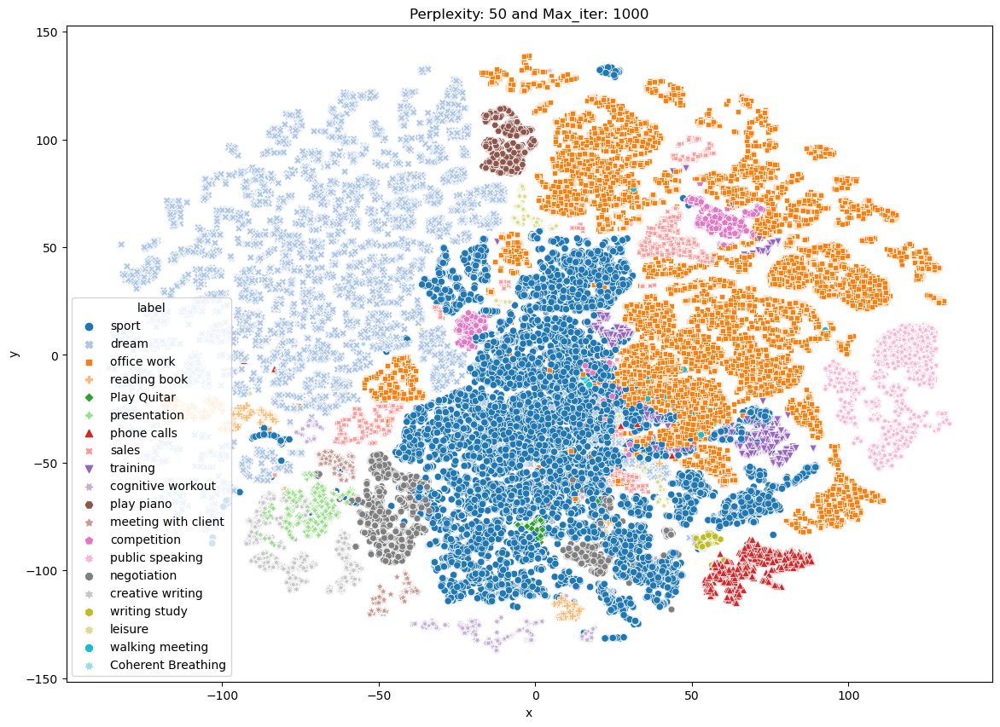

In [98]:
colors = sns.color_palette('tab20', n_colors=20)  # Choose a larger color palette
# Prepare the data for seaborn
print('Creating plot for this t-SNE visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_train['Activities Detailed']})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("Perplexity: {} and Max_iter: {}".format(perplexity, n_iter))
plt.show()

In [58]:
y_train

,Activities Detailed,Target
194779,sport,16
144310,dream,5
220145,sport,16
141697,dream,5
214535,sport,16
...,...,...
49582,sport,16
173083,presentation,12
15965,office work,9
43886,sport,16


In [62]:
colors = sns.color_palette('tab20', n_colors=20)  # Choose a larger color palette

Creating plot for this t-SNE visualization..


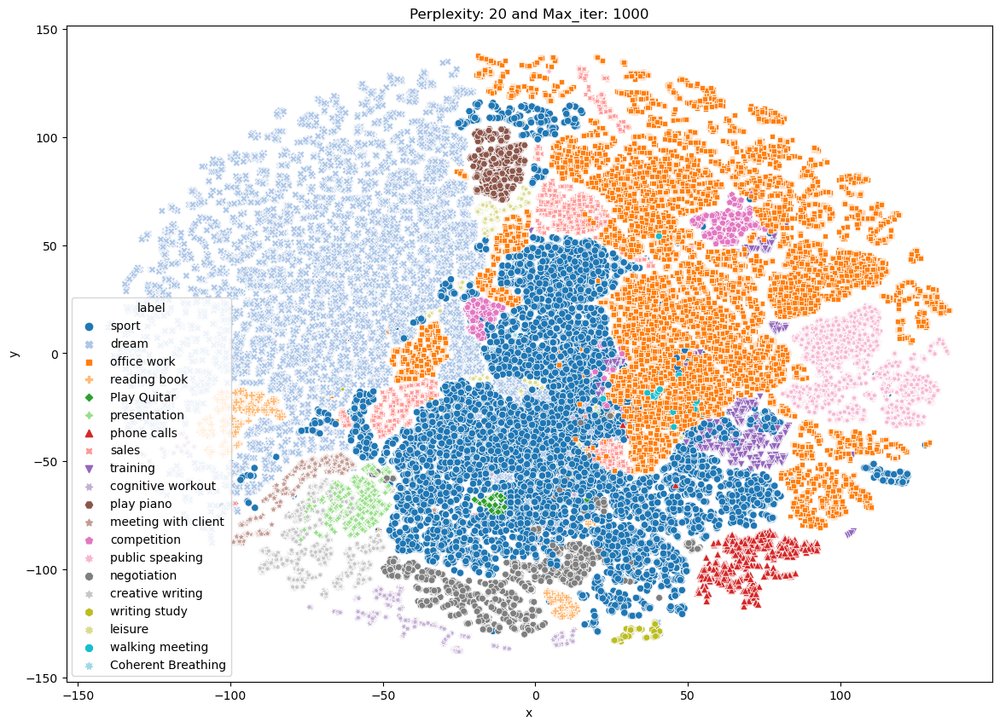

In [63]:
# Prepare the data for seaborn
print('Creating plot for this t-SNE visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_train['Activities Detailed']})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("Perplexity: {} and Max_iter: {}".format(perplexity, n_iter))
plt.show()

Creating plot for this t-SNE visualization..


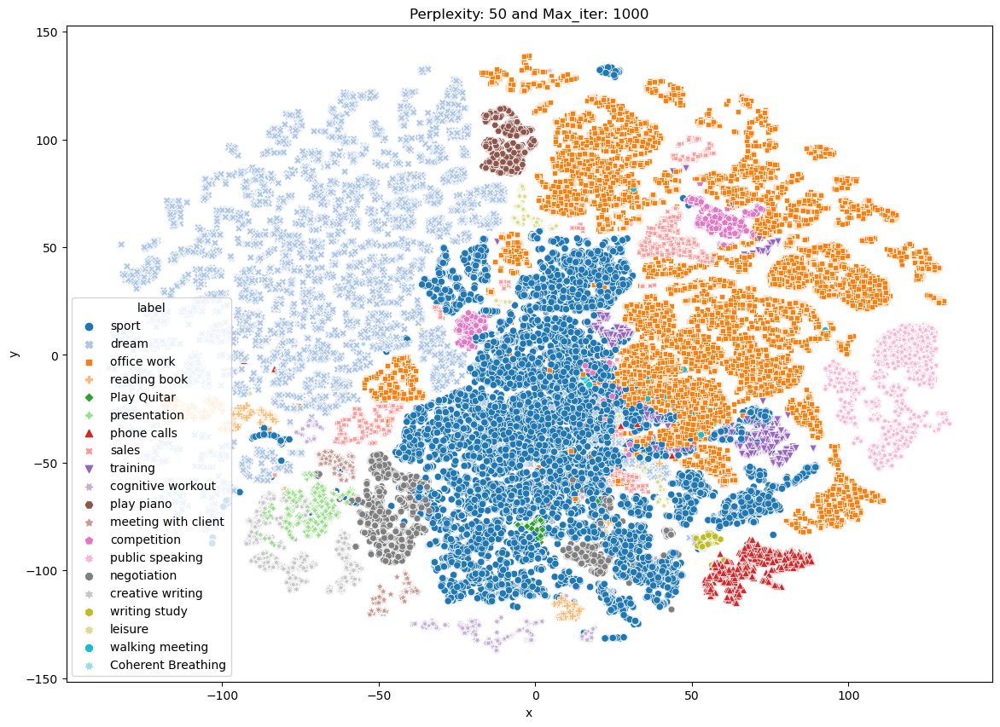

i: 0, label: sport, x: -19.623090744018555, y: -103.8801040649414
i: 1, label: dream, x: -84.66925048828125, y: 62.370609283447266
i: 5, label: office work, x: 78.80473327636719, y: 34.54970169067383
i: 11, label: reading book, x: -90.91522979736328, y: -26.362346649169922
i: 13, label: Play Quitar, x: 1.7207082509994507, y: -76.720947265625
i: 16, label: presentation, x: -75.79663848876953, y: -78.14498901367188
i: 27, label: phone calls, x: 59.701602935791016, y: -99.29281616210938
i: 31, label: sales, x: 51.69490432739258, y: 92.06078338623047
i: 51, label: training, x: 62.32212829589844, y: -35.46988296508789
i: 53, label: cognitive workout, x: -2.501133680343628, y: -124.0674819946289
i: 55, label: play piano, x: -12.710561752319336, y: 98.51083374023438
i: 63, label: meeting with client, x: -50.77619934082031, y: -115.05191802978516
i: 71, label: competition, x: 64.84806823730469, y: 56.920631408691406
i: 86, label: public speaking, x: 111.01509857177734, y: -47.52277755737305
i:

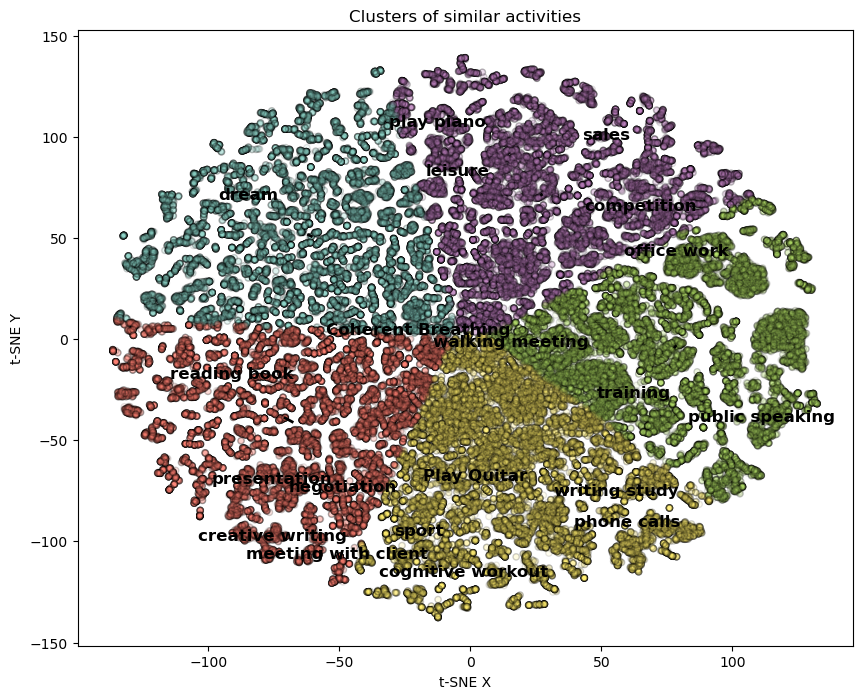

In [105]:
# Prepare the data for seaborn
print('Creating plot for this t-SNE visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_train['Activities Detailed']})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("Perplexity: {} and Max_iter: {}".format(perplexity, n_iter))
plt.show()

num_clusters = 5  # You can adjust this based on your data
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)
cluster_labels = kmeans.labels_
df['cluster'] = cluster_labels

# Create a scatter plot of the t-SNE embeddings with labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='Set3', alpha=0.1, s=20, edgecolor='k')



# Draw contours between clusters
centers = kmeans.cluster_centers_

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = df['label'].unique()
for label in unique_labels:
    label_indices = np.where(df['label'] == label)[0]  # Find indices of data points with this label

    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])

    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)

    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()

# # Iterate through data points and display the label only if it's in the most common cluster
# for i, label in enumerate(df['label']):
#     cluster = cluster_labels[i]
#     if cluster == label_most_common_cluster[label] and label not in displayed_labels:
#         plt.annotate(label, (df['x'][i], df['y'][i]), textcoords="offset points", xytext=(0, 10), ha='center',
#                      fontsize=12, fontweight='bold')
#         displayed_labels.add(label)

for i, label in enumerate(df['label']):
    if i < len(df):  # Check if 'i' is within the valid range of DataFrame indices
        cluster = cluster_labels[i]
        if cluster == label_most_common_cluster.get(label, None) and label not in displayed_labels:
            x_value = df['x'].iloc[i]
            y_value = df['y'].iloc[i]
            print(f"i: {i}, label: {label}, x: {x_value}, y: {y_value}")
            plt.annotate(label, (x_value, y_value), textcoords="offset points", xytext=(0, 10), ha='center',
                         fontsize=12, fontweight='bold')
            displayed_labels.add(label)
    else:
        print(f"Skipping index {i} as it's out of DataFrame bounds.")
        
for i in range(num_clusters):
    cluster_points = X[cluster_labels == i]
    closest_center = pairwise_distances_argmin_min(centers[i].reshape(1, -1), cluster_points)
    closest_point_idx = closest_center[0][0]
    closest_point = cluster_points[closest_point_idx]

    plt.plot([centers[i][0], closest_point[0]], [centers[i][1], closest_point[1]], 'k-', linewidth=2)

plt.xlabel('t-SNE X')
plt.ylabel('t-SNE Y')
plt.title('Clusters of similar activities')
plt.show()

In [106]:
# Create a table to display clusters and labels
cluster_table = pd.DataFrame(columns=['Cluster', 'Labels'])
for i in range(num_clusters):
    cluster_labels_list = []
    for label, cluster in label_most_common_cluster.items():
        if cluster == i:
            cluster_labels_list.append(label)
    cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)

# Set the index to the 'Cluster' column and add 1 to the 'Cluster' values
cluster_table.index = cluster_table['Cluster']
cluster_table['Cluster'] = cluster_table.index + 1

# Adjust the display width to prevent label text from being cut
pd.set_option('display.max_colwidth', None)

# Display the table
print(cluster_table)
plt.show()

         Cluster  \
Cluster            
1              2   
2              3   
3              4   
4              5   
5              6   

                                                                                                     Labels  
Cluster                                                                                                      
1                                                                                                     dream  
2        reading book, presentation, meeting with client, negotiation, creative writing, Coherent Breathing  
3                                                                    office work, training, public speaking  
4                                                                   sales, play piano, competition, leisure  
5                        sport, Play Quitar, phone calls, cognitive workout, writing study, walking meeting  


In [102]:
X = df[['x', 'y']].values

In [68]:
X

array([[-33.7079   , -83.676414 ],
       [-77.52857  ,  51.273746 ],
       [-16.600388 , -61.140892 ],
       ...,
       [ 54.87984  ,  73.82751  ],
       [ -2.141127 ,  -5.4948435],
       [108.07627  ,  13.354708 ]], dtype=float32)

In [78]:
labels = unique_labels

In [79]:
unique_labels

array(['sport', 'dream', 'office work', 'reading book', 'Play Quitar',
       'presentation', 'phone calls', 'sales', 'training',
       'cognitive workout', 'play piano', 'meeting with client',
       'competition', 'public speaking', 'negotiation',
       'creative writing', 'writing study', 'leisure', 'walking meeting',
       'Coherent Breathing'], dtype=object)

In [81]:
df

,x,y,label,color,cluster
194779,-33.707901,-83.676414,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",0
144310,-77.528572,51.273746,dream,"(0.6823529411764706, 0.7803921568627451, 0.909...",4
220145,-16.600388,-61.140892,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",0
141697,-61.119411,18.475437,dream,"(0.6823529411764706, 0.7803921568627451, 0.909...",4
214535,30.470858,-116.500175,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",0
...,...,...,...,...,...
49582,58.355877,-55.451469,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",0
173083,-53.509872,-53.537395,presentation,"(0.596078431372549, 0.8745098039215686, 0.5411...",2
15965,54.879841,73.827507,office work,"(1.0, 0.4980392156862745, 0.054901960784313725)",1
43886,-2.141127,-5.494843,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",2


In [85]:
df

,x,y,label,color,cluster
194779,-33.707901,-83.676414,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",0
144310,-77.528572,51.273746,dream,"(0.6823529411764706, 0.7803921568627451, 0.909...",4
220145,-16.600388,-61.140892,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",0
141697,-61.119411,18.475437,dream,"(0.6823529411764706, 0.7803921568627451, 0.909...",4
214535,30.470858,-116.500175,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",0
...,...,...,...,...,...
49582,58.355877,-55.451469,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",0
173083,-53.509872,-53.537395,presentation,"(0.596078431372549, 0.8745098039215686, 0.5411...",2
15965,54.879841,73.827507,office work,"(1.0, 0.4980392156862745, 0.054901960784313725)",1
43886,-2.141127,-5.494843,sport,"(0.12156862745098039, 0.4666666666666667, 0.70...",2


In [86]:
df_sorted = df.sort_index()

In [84]:
X

array([[-33.7079   , -83.676414 ],
       [-77.52857  ,  51.273746 ],
       [-16.600388 , -61.140892 ],
       ...,
       [ 54.87984  ,  73.82751  ],
       [ -2.141127 ,  -5.4948435],
       [108.07627  ,  13.354708 ]], dtype=float32)

Creating plot for this t-SNE visualization..


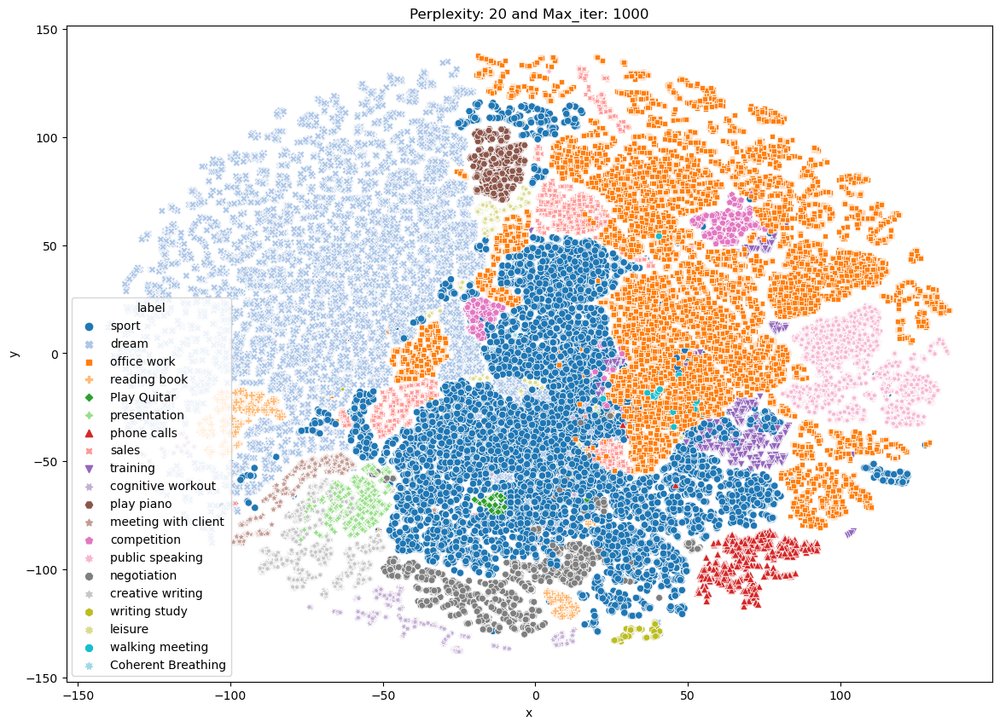

C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


i: 1, label: dream, x: -77.52857208251953, y: 51.273746490478516
i: 2, label: sport, x: -16.600387573242188, y: -61.140892028808594
i: 5, label: office work, x: 111.35621643066406, y: 41.33441162109375
i: 11, label: reading book, x: -98.49966430664062, y: -36.45220947265625
i: 13, label: Play Quitar, x: -11.300861358642578, y: -66.09636688232422
i: 16, label: presentation, x: -64.5853042602539, y: -76.38916778564453
i: 27, label: phone calls, x: 59.32286834716797, y: -100.96745300292969
i: 31, label: sales, x: 21.932165145874023, y: 112.68207550048828
i: 51, label: training, x: 59.50961685180664, y: -32.33835220336914
i: 55, label: play piano, x: -5.937260627746582, y: 84.87228393554688
i: 62, label: cognitive workout, x: -47.48701477050781, y: -113.32256317138672
i: 63, label: meeting with client, x: -85.2389144897461, y: -62.50703048706055
i: 71, label: competition, x: 64.73857116699219, y: 51.809608459472656
i: 86, label: public speaking, x: 121.04071807861328, y: -27.40823745727539

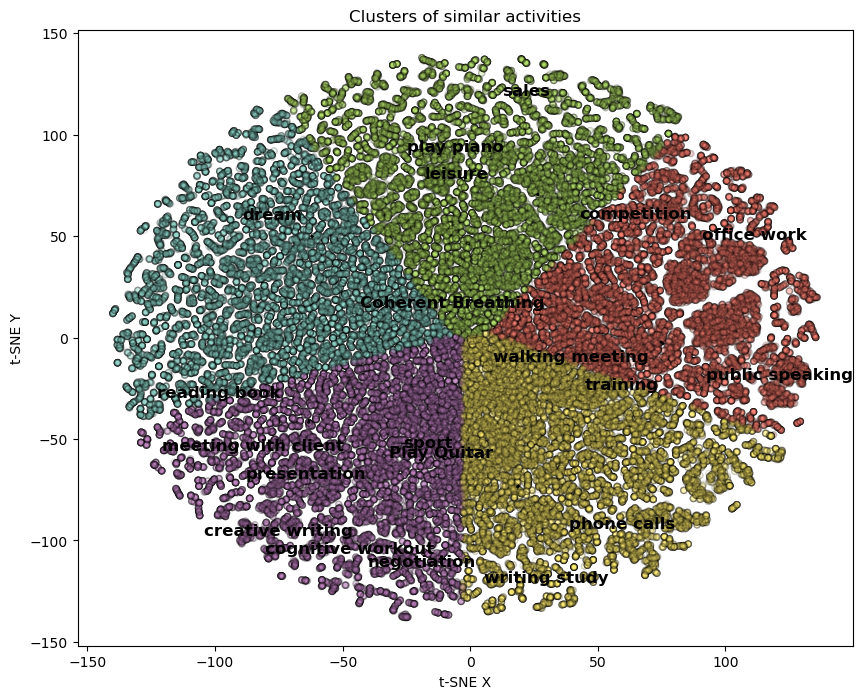

In [91]:
# Prepare the data for seaborn
print('Creating plot for this t-SNE visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_train['Activities Detailed']})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("Perplexity: {} and Max_iter: {}".format(perplexity, n_iter))
plt.show()

# Create a scatter plot of the t-SNE embeddings with labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='Set3', alpha=0.1, s=20, edgecolor='k')

num_clusters = 5  # You can adjust this based on your data
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)
cluster_labels = kmeans.labels_
df['cluster'] = cluster_labels

# Draw contours between clusters
centers = kmeans.cluster_centers_

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = df['label'].unique()
for label in unique_labels:
    label_indices = np.where(df['label'] == label)[0]  # Find indices of data points with this label

    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])

    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)

    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()

# # Iterate through data points and display the label only if it's in the most common cluster
# for i, label in enumerate(df['label']):
#     cluster = cluster_labels[i]
#     if cluster == label_most_common_cluster[label] and label not in displayed_labels:
#         plt.annotate(label, (df['x'][i], df['y'][i]), textcoords="offset points", xytext=(0, 10), ha='center',
#                      fontsize=12, fontweight='bold')
#         displayed_labels.add(label)

for i, label in enumerate(df['label']):
    if i < len(df):  # Check if 'i' is within the valid range of DataFrame indices
        cluster = cluster_labels[i]
        if cluster == label_most_common_cluster.get(label, None) and label not in displayed_labels:
            x_value = df['x'].iloc[i]
            y_value = df['y'].iloc[i]
            print(f"i: {i}, label: {label}, x: {x_value}, y: {y_value}")
            plt.annotate(label, (x_value, y_value), textcoords="offset points", xytext=(0, 10), ha='center',
                         fontsize=12, fontweight='bold')
            displayed_labels.add(label)
    else:
        print(f"Skipping index {i} as it's out of DataFrame bounds.")
        
for i in range(num_clusters):
    cluster_points = X[cluster_labels == i]
    closest_center = pairwise_distances_argmin_min(centers[i].reshape(1, -1), cluster_points)
    closest_point_idx = closest_center[0][0]
    closest_point = cluster_points[closest_point_idx]

    plt.plot([centers[i][0], closest_point[0]], [centers[i][1], closest_point[1]], 'k-', linewidth=2)

plt.xlabel('t-SNE X')
plt.ylabel('t-SNE Y')
plt.title('Clusters of similar activities')
plt.show()

In [ ]:
# Create a scatter plot of the t-SNE embeddings with labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='Set3', alpha=0.1, s=20, edgecolor='k')

# Draw contours between clusters
centers = kmeans.cluster_centers_

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = df['label'].unique()
for label in unique_labels:
    label_indices = np.where(df['label'] == label)[0]  # Find indices of data points with this label

    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])

    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)

    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()

# Iterate through data points and display the label only if it's in the most common cluster
for i, label in enumerate(df['label']):
    cluster = cluster_labels[i]
    if cluster == label_most_common_cluster[label] and label not in displayed_labels:
        plt.annotate(label, (df['x'][i], df['y'][i]), textcoords="offset points", xytext=(0, 10), ha='center',
                     fontsize=12, fontweight='bold')
        displayed_labels.add(label)

for i in range(num_clusters):
    cluster_points = X[cluster_labels == i]
    closest_center = pairwise_distances_argmin_min(centers[i].reshape(1, -1), cluster_points)
    closest_point_idx = closest_center[0][0]
    closest_point = cluster_points[closest_point_idx]

    plt.plot([centers[i][0], closest_point[0]], [centers[i][1], closest_point[1]], 'k-', linewidth=2)

plt.xlabel('t-SNE X')
plt.ylabel('t-SNE Y')
plt.title('Clusters of similar activities')
plt.show()

In [93]:
from sklearn.cluster import DBSCAN

In [94]:
# Create a DBSCAN clustering model
dbscan = DBSCAN(eps=0.5, min_samples=5)  # You can adjust 'eps' and 'min_samples' as needed

# Fit the model and obtain cluster labels
cluster_labels = dbscan.fit_predict(X)

# Add the cluster labels to your DataFrame
df['cluster'] = cluster_labels

In [105]:
from sklearn.neighbors import NearestNeighbors, KNeighborsTransformer
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import cosine_similarity

In [109]:
import umap
from sklearn.metrics import pairwise_distances_argmin_min

In [113]:
colors = sns.color_palette('tab20', n_colors=20) 

In [117]:
colors = sns.color_palette('tab20', n_colors=20)  # Choose a larger color palette
n_neighbors = 100  # Adjust this parameter based on your data
min_dist = 0.1  # Adjust this parameter based on your data
umap_model = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, verbose=True)
X_reduced = umap_model.fit_transform(X_train_scaled)


UMAP(n_neighbors=100, verbose=True)
Thu Sep  7 23:40:22 2023 Construct fuzzy simplicial set
Thu Sep  7 23:40:22 2023 Finding Nearest Neighbors
Thu Sep  7 23:40:22 2023 Building RP forest with 26 trees
Thu Sep  7 23:40:23 2023 NN descent for 17 iterations
	 1  /  17
	 2  /  17
	Stopping threshold met -- exiting after 2 iterations
Thu Sep  7 23:42:22 2023 Finished Nearest Neighbor Search
Thu Sep  7 23:42:28 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Thu Sep  7 23:47:20 2023 Finished embedding


Creating plot for this UMAP visualization..


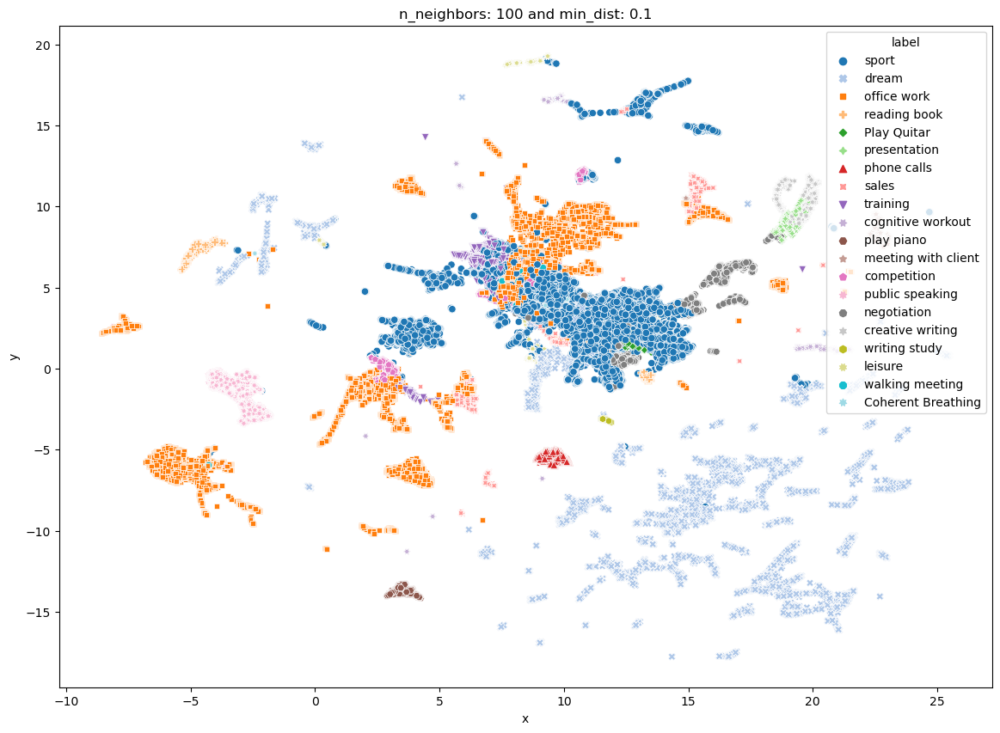

C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


i: 0, label: sport, x: 14.684330940246582, y: 1.2114585638046265
i: 1, label: dream, x: 15.877758026123047, y: -7.595731258392334
i: 5, label: office work, x: 2.9451992511749268, y: -6.349165439605713
i: 13, label: Play Quitar, x: 12.548970222473145, y: 1.770139217376709
i: 16, label: presentation, x: 19.206422805786133, y: 9.5352201461792
i: 27, label: phone calls, x: 9.22574234008789, y: -5.198381423950195
i: 43, label: sales, x: 9.913261413574219, y: 1.6359094381332397
i: 51, label: training, x: 8.185890197753906, y: 6.5371551513671875
i: 53, label: cognitive workout, x: 19.461166381835938, y: 1.301736831665039
i: 55, label: play piano, x: 3.4800615310668945, y: -13.4942045211792
i: 63, label: meeting with client, x: 22.613832473754883, y: 8.123647689819336
i: 71, label: competition, x: 3.070589780807495, y: -0.01317883376032114
i: 86, label: public speaking, x: -1.9103554487228394, y: -2.918121814727783
i: 114, label: negotiation, x: 16.536418914794922, y: 6.159179210662842
i: 138,

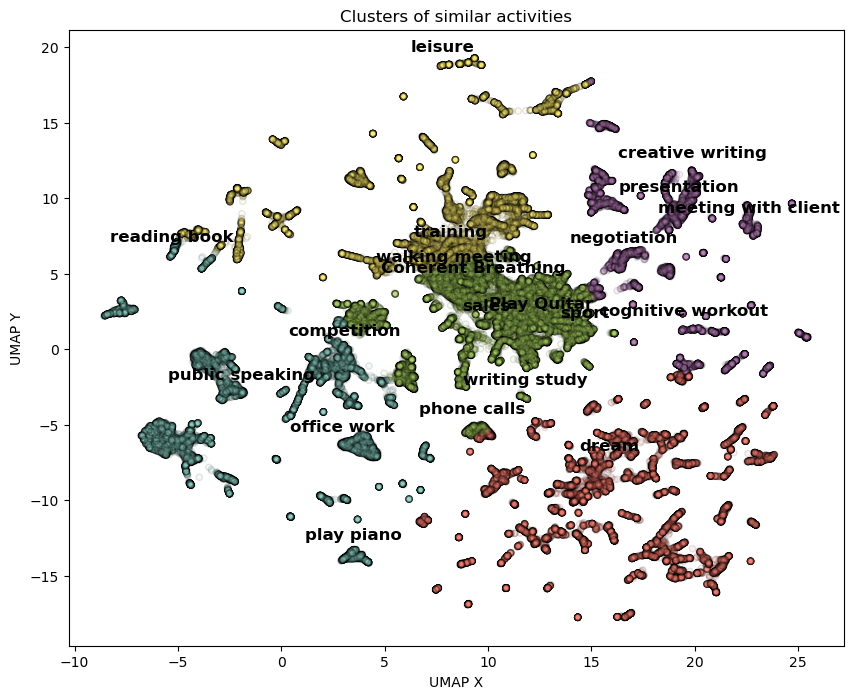

In [118]:
# Prepare the data for seaborn
print('Creating plot for this UMAP visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_train['Activities Detailed']})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("n_neighbors: {} and min_dist: {}".format(n_neighbors, min_dist))
plt.show()


X = df[['x', 'y']].values

num_clusters = 5  # You can adjust this based on your data
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)
cluster_labels = kmeans.labels_
df['cluster'] = cluster_labels

# Create a scatter plot of the UMAP embeddings with labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='Set3', alpha=0.1, s=20, edgecolor='k')

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = df['label'].unique()
for label in unique_labels:
    label_indices = np.where(df['label'] == label)[0]  # Find indices of data points with this label

    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])

    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)

    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()


for i, label in enumerate(df['label']):
    if i < len(df):  # Check if 'i' is within the valid range of DataFrame indices
        cluster = cluster_labels[i]
        if cluster == label_most_common_cluster.get(label, None) and label not in displayed_labels:
            x_value = df['x'].iloc[i]
            y_value = df['y'].iloc[i]
            print(f"i: {i}, label: {label}, x: {x_value}, y: {y_value}")
            plt.annotate(label, (x_value, y_value), textcoords="offset points", xytext=(0, 10), ha='center',
                         fontsize=12, fontweight='bold')
            displayed_labels.add(label)
    else:
        print(f"Skipping index {i} as it's out of DataFrame bounds.")

plt.xlabel('UMAP X')
plt.ylabel('UMAP Y')
plt.title('Clusters of similar activities')
plt.show()

Creating plot for this UMAP visualization..


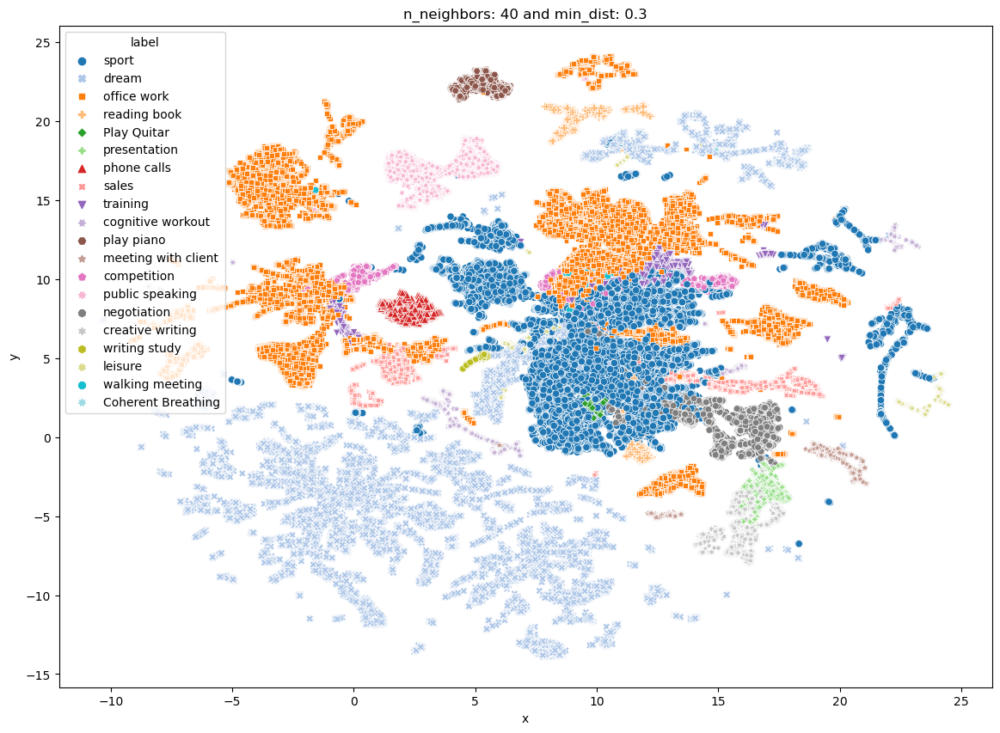

C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


i: 0, label: sport, x: 8.555065155029297, y: -0.35056930780410767
i: 1, label: dream, x: -0.23913253843784332, y: -4.445178985595703
i: 9, label: office work, x: 11.447333335876465, y: 14.3583345413208
i: 11, label: reading book, x: 10.271743774414062, y: 20.672761917114258
i: 13, label: Play Quitar, x: 9.972197532653809, y: 2.3934473991394043
i: 16, label: presentation, x: 16.85825538635254, y: -4.135151386260986
i: 27, label: phone calls, x: 2.9433419704437256, y: 7.756697654724121
i: 31, label: sales, x: 0.030726129189133644, y: 2.6748011112213135
i: 51, label: training, x: 11.514293670654297, y: 10.189531326293945
i: 55, label: play piano, x: 5.244345188140869, y: 22.77869415283203
i: 62, label: cognitive workout, x: 3.331568956375122, y: 2.166471004486084
i: 63, label: meeting with client, x: 20.518455505371094, y: -2.2453107833862305
i: 71, label: competition, x: 0.10534806549549103, y: 10.420088768005371
i: 86, label: public speaking, x: 5.771641254425049, y: 16.960952758789062


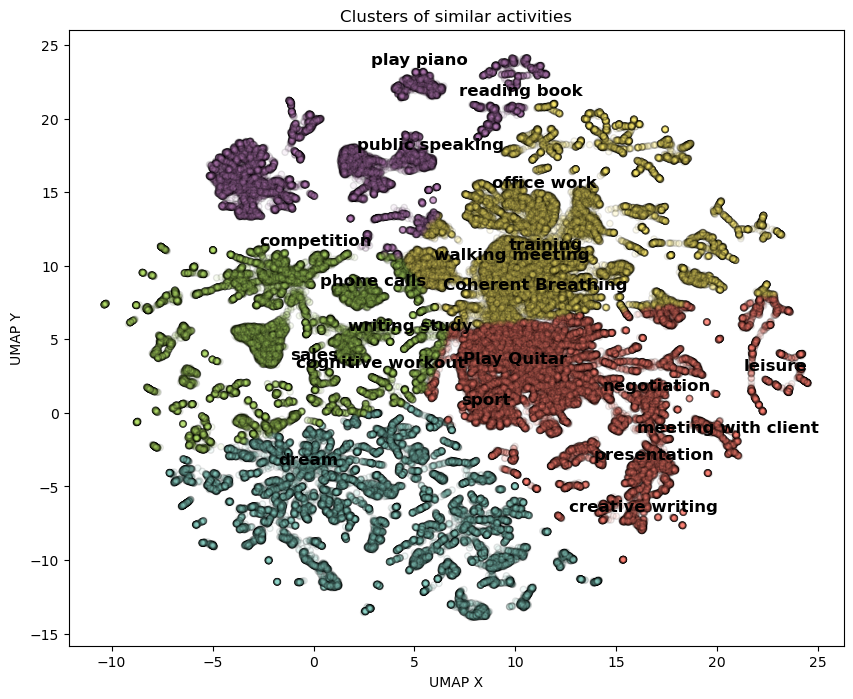

In [115]:
# Prepare the data for seaborn
print('Creating plot for this UMAP visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_train['Activities Detailed']})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("n_neighbors: {} and min_dist: {}".format(n_neighbors, min_dist))
plt.show()


X = df[['x', 'y']].values

num_clusters = 5  # You can adjust this based on your data
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)
cluster_labels = kmeans.labels_
df['cluster'] = cluster_labels

# Create a scatter plot of the UMAP embeddings with labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='Set3', alpha=0.1, s=20, edgecolor='k')

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = df['label'].unique()
for label in unique_labels:
    label_indices = np.where(df['label'] == label)[0]  # Find indices of data points with this label

    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])

    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)

    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()


for i, label in enumerate(df['label']):
    if i < len(df):  # Check if 'i' is within the valid range of DataFrame indices
        cluster = cluster_labels[i]
        if cluster == label_most_common_cluster.get(label, None) and label not in displayed_labels:
            x_value = df['x'].iloc[i]
            y_value = df['y'].iloc[i]
            print(f"i: {i}, label: {label}, x: {x_value}, y: {y_value}")
            plt.annotate(label, (x_value, y_value), textcoords="offset points", xytext=(0, 10), ha='center',
                         fontsize=12, fontweight='bold')
            displayed_labels.add(label)
    else:
        print(f"Skipping index {i} as it's out of DataFrame bounds.")

plt.xlabel('UMAP X')
plt.ylabel('UMAP Y')
plt.title('Clusters of similar activities')
plt.show()

In [116]:

# Create a table to display clusters and labels
cluster_table = pd.DataFrame(columns=['Cluster', 'Labels'])
for i in range(num_clusters):
    cluster_labels_list = []
    for label, cluster in label_most_common_cluster.items():
        if cluster == i:
            cluster_labels_list.append(label)
    cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)

# Set the index to the 'Cluster' column and add 1 to the 'Cluster' values
cluster_table.index = cluster_table['Cluster']
cluster_table['Cluster'] = cluster_table.index + 1

# Adjust the display width to prevent label text from being cut
pd.set_option('display.max_colwidth', None)

# Display the table
print(cluster_table)
plt.show()

         Cluster  \
Cluster            
1              2   
2              3   
3              4   
4              5   
5              6   

                                                                                                Labels  
Cluster                                                                                                 
1                                                                                                dream  
2        sport, Play Quitar, presentation, meeting with client, negotiation, creative writing, leisure  
3                                    phone calls, sales, cognitive workout, competition, writing study  
4                                                            reading book, play piano, public speaking  
5                                           office work, training, walking meeting, Coherent Breathing  


C:\Users\david\AppData\Local\Temp\ipykernel_12116\3285927629.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)
C:\Users\david\AppData\Local\Temp\ipykernel_12116\3285927629.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)
C:\Users\david\AppData\Local\Temp\ipykernel_12116\3285927629.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)
C:\Users\david\AppData\Local\Temp\ipyker

# Model

In [35]:
clf1 = RandomForestClassifier(
    n_estimators=271,
    max_depth=36,
    min_samples_split=19,
    min_samples_leaf=11,
    random_state=42
)



clf2 = XGBClassifier(
    learning_rate=0.06048731265187917,
    n_estimators=195,
    max_depth=9,
    subsample= 0.7790510010086706,
    colsample_bytree=0.6220627611238871,
    random_state=42
)

clf3 = AdaBoostClassifier(
    n_estimators=170,
    learning_rate=0.2379351625419417,
    random_state=42
)

clf4 = GradientBoostingClassifier(
    n_estimators=186,
    learning_rate=0.01208563915935721,
    max_depth=9,
    subsample=0.7424149856794916,
    random_state=42
)


clf5 = DecisionTreeClassifier(
    max_depth=16,
    min_samples_split=9,
    min_samples_leaf=4,
    random_state=42
)


# Define the ensemble classifier with the scaler
models = VotingClassifier(estimators=[
    ('rfc', clf1), 
    ('xgb', clf2), 
    ('ada', clf3), 
    ('gbc', clf4), 
    ('dtc', clf5)],
    voting='soft')

# Fit the pipeline to the training data
models.fit(X_train_scaled[['HR','HRV','BR','Posture', 'Activity', 'Impact_Binary','Bounds_Binary']], y_train_target)



C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


VotingClassifier(estimators=[('rfc',
                              RandomForestClassifier(max_depth=36,
                                                     min_samples_leaf=11,
                                                     min_samples_split=19,
                                                     n_estimators=271,
                                                     random_state=42)),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.6220627611238871,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval...
                             ('ada',
                              AdaBoostClassifier(learning_rate=0.2379351625419417,
                                                 n_estimators=170,
                                                 random_state=42)),
                             ('gbc',
                              GradientBoostingClassifier(learning_rate=0.01208563915935721,
                                                         max_depth=9,
                                                         n_estimators=186,
                                                         random_state=42,
                                                         subsample=0.7424149856794916)),
                             ('dtc',
                              DecisionTreeClassifier(max_depth=16,
                                                     min_samples_leaf=4,
                                                     min_samples_split=9,
                                                     random_state=42))],
                 voting='soft')

In [36]:
X

,Time,Year,Month,Weekday,Hour,HR,BR,Posture,Activity,PeakAcceleration,...,AvStepImpulse,AvStepPeriod,JumpFlightTime,PeakAccelPhi,peakAccelTheta,Controled stress,stress,Before Controled stress,After controlled stress,Name of the volunteer
0,26.3.2020 9:02:28,2020,March,Thursday,9,79,15,16,"0,01","0,02",...,0,0,0,163,-50,1.0,NaN,NaN,NaN,EM
1,26.3.2020 9:02:29,2020,March,Thursday,9,79,15,16,"0,01","0,1",...,0,0,0,168,-87,1.0,NaN,NaN,NaN,EM
2,26.3.2020 9:02:30,2020,March,Thursday,9,79,15,17,"0,01","0,03",...,0,0,0,164,-47,1.0,NaN,NaN,NaN,EM
3,26.3.2020 9:02:31,2020,March,Thursday,9,79,15,17,"0,01","0,02",...,0,0,0,163,-43,1.0,NaN,NaN,NaN,EM
4,26.3.2020 9:02:32,2020,March,Thursday,9,79,15,17,0,"0,02",...,0,0,0,163,-50,1.0,NaN,NaN,NaN,EM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271793,22.6.2022 6:35:10,2022,June,Wednesday,6,84,20,-34,"0,04","0,08",...,"2,75","0,351",0,140,91,NaN,1.0,NaN,NaN,EM
271794,22.6.2022 6:35:11,2022,June,Wednesday,6,84,20,-35,"0,01","0,03",...,0,0,0,142,91,NaN,1.0,NaN,NaN,EM
271795,22.6.2022 6:35:12,2022,June,Wednesday,6,84,19,-36,"0,04","0,19",...,0,0,0,133,95,NaN,1.0,NaN,NaN,EM
271796,22.6.2022 6:35:13,2022,June,Wednesday,6,85,19,-38,"0,05","0,09",...,0,0,0,135,95,NaN,1.0,NaN,NaN,EM


In [37]:
from sklearn.model_selection import RandomizedSearchCV
from scipy import stats
import dask.diagnostics

# Define the parameter distributions for each classifier
param_distributions = {
    'rfc__n_estimators': stats.randint(100, 500),
    'rfc__max_depth': [None] + list(np.arange(5, 51)),
    'rfc__min_samples_split': stats.randint(2, 20),
    'rfc__min_samples_leaf': stats.randint(1, 20),
    
    'xgb__learning_rate': stats.uniform(0.01, 0.3),
    'xgb__n_estimators': stats.randint(100, 500),
    'xgb__max_depth': stats.randint(2, 10),
    'xgb__subsample': stats.uniform(0.5, 0.5),
    'xgb__colsample_bytree': stats.uniform(0.5, 0.5),
    
    'ada__n_estimators': stats.randint(50, 200),
    'ada__learning_rate': stats.uniform(0.01, 1.0),
    
    'gbc__n_estimators': stats.randint(50, 200),
    'gbc__learning_rate': stats.uniform(0.01, 0.3),
    'gbc__max_depth': stats.randint(2, 10),
    'gbc__subsample': stats.uniform(0.5, 0.5),

    'dtc__max_depth': [None] + list(np.arange(5, 51)),
    'dtc__min_samples_split': stats.randint(2, 20),
    'dtc__min_samples_leaf': stats.randint(1, 20)
}



In [38]:
# # Perform the random search
# search = RandomizedSearchCV(models, param_distributions, n_iter=10, cv=3, verbose=2,  random_state=42)

# with dask.diagnostics.ProgressBar():
#     search.fit(X_train_scaled.sample(n= 10000, random_state= 42)[['HR','HRV','BR','Posture', 'Activity', 'Impact_Binary','Bounds_Binary']], y_train_target.sample(n= 10000, random_state= 42))

In [39]:
best_params_  = {'ada__learning_rate': 0.2379351625419417, 'ada__n_estimators': 170, 'dtc__max_depth': 16, 'dtc__min_samples_leaf': 9, 'dtc__min_samples_split': 4, 'gbc__learning_rate': 0.01208563915935721, 'gbc__max_depth': 9, 'gbc__n_estimators': 186, 'gbc__subsample': 0.7424149856794916, 'rfc__max_depth': 36, 'rfc__min_samples_leaf': 19, 'rfc__min_samples_split': 11, 'rfc__n_estimators': 271, 'xgb__colsample_bytree': 0.6220627611238871, 'xgb__learning_rate': 0.06048731265187917, 'xgb__max_depth': 9, 'xgb__n_estimators': 195, 'xgb__subsample': 0.7790510010086706}

# Check the best parameters
print(best_params_)

#{'ada__learning_rate': 0.2379351625419417, 'ada__n_estimators': 170, 'dtc__max_depth': 16, 'dtc__min_samples_leaf': 9, 'dtc__min_samples_split': 4, 'gbc__learning_rate': 0.01208563915935721, 'gbc__max_depth': 9, 'gbc__n_estimators': 186, 'gbc__subsample': 0.7424149856794916, 'rfc__max_depth': 36, 'rfc__min_samples_leaf': 19, 'rfc__min_samples_split': 11, 'rfc__n_estimators': 271, 'xgb__colsample_bytree': 0.6220627611238871, 'xgb__learning_rate': 0.06048731265187917, 'xgb__max_depth': 9, 'xgb__n_estimators': 195, 'xgb__subsample': 0.7790510010086706}

{'ada__learning_rate': 0.2379351625419417, 'ada__n_estimators': 170, 'dtc__max_depth': 16, 'dtc__min_samples_leaf': 9, 'dtc__min_samples_split': 4, 'gbc__learning_rate': 0.01208563915935721, 'gbc__max_depth': 9, 'gbc__n_estimators': 186, 'gbc__subsample': 0.7424149856794916, 'rfc__max_depth': 36, 'rfc__min_samples_leaf': 19, 'rfc__min_samples_split': 11, 'rfc__n_estimators': 271, 'xgb__colsample_bytree': 0.6220627611238871, 'xgb__learning_rate': 0.06048731265187917, 'xgb__max_depth': 9, 'xgb__n_estimators': 195, 'xgb__subsample': 0.7790510010086706}


In [40]:
y_pred_train = models.predict(X_train_scaled[['HR','HRV','BR','Posture', 'Activity', 'Impact_Binary','Bounds_Binary']])

In [41]:
# Generate a classification report
class_report = classification_report(y_pred_train, y_train_target)



In [42]:
print("Classification Report:")
print(class_report)

Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        57
           1       0.97      0.93      0.95       448
           2       0.97      0.99      0.98      1999
           3       0.64      0.97      0.77      1662
           4       0.95      0.87      0.91      3612
           5       0.99      1.00      0.99     44145
           6       0.99      1.00      0.99      1257
           7       0.87      0.86      0.87      1768
           8       0.77      0.89      0.82      4414
           9       0.96      0.90      0.92     51916
          10       0.99      0.99      0.99      2783
          11       0.99      0.98      0.99      2213
          12       0.93      0.84      0.88      2461
          13       1.00      0.98      0.99      7238
          14       0.95      0.97      0.96      2154
          15       0.81      0.86      0.83      5298
          16       0.93      0.96      0.95     45465
    

## Save model

In [43]:
# Save the pipeline to a file
filename = 'ensamble_fitted_model_summerschool2023_stress_HR_BR_HRV.joblib'
joblib.dump(models, filename)

['ensamble_fitted_model_summerschool2023_stress_HR_BR_HRV.joblib']

## Feature Importance

In [44]:
# Get feature importances for each individual model
feature_importances = pd.DataFrame()

for name, clf in models.named_estimators_.items():
    if hasattr(clf, 'feature_importances_'):
        feature_importances[name] = clf.feature_importances_

feature_importances.index = X_train_scaled[['HR','HRV','BR','Posture', 'Activity', 'Impact_Binary','Bounds_Binary']].columns

In [45]:
feature_importances

,rfc,xgb,ada,gbc,dtc
HR,0.215099,0.063609,0.076471,0.263206,0.180962
HRV,0.194019,0.048300,0.123529,0.205366,0.229353
BR,0.087550,0.026985,0.194118,0.071338,0.076393
Posture,0.237149,0.072473,0.276471,0.239885,0.217209
Activity,0.026689,0.009682,0.000000,0.015553,0.010685
Impact_Binary,0.159838,0.518999,0.205882,0.134511,0.193034
Bounds_Binary,0.079656,0.259951,0.123529,0.070142,0.092363


<Axes: >

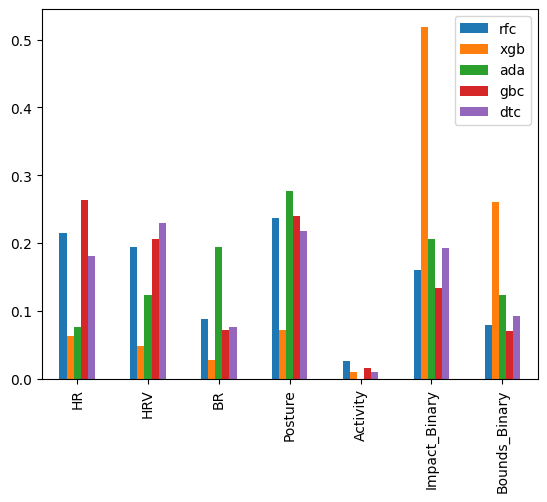

In [46]:
feature_importances.plot(kind='bar')

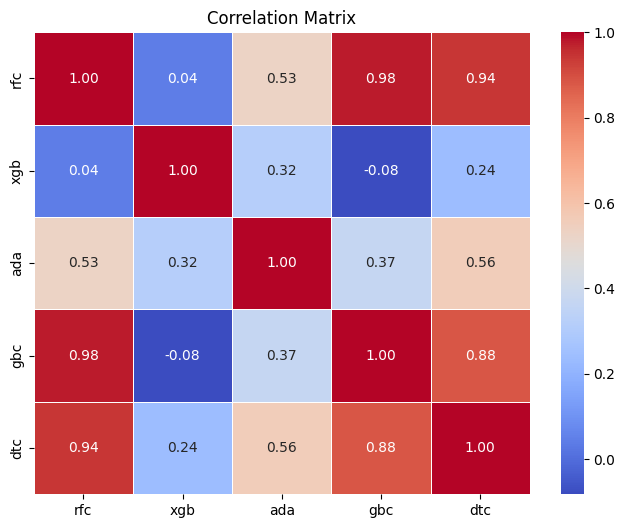

In [47]:
# Calculate the correlation matrix
corr_matrix = feature_importances.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

## X_test & Y_test prep

In [48]:
X_test_initial = X_test.copy()
X_test_loaded = data_cleaner.transform(X_test_initial)   #data cleaning
X_test_preprocessed = X_test_loaded.drop(columns = drop) #columns drop
X_test_non_binary = X_test_preprocessed.copy()           #copy df

In [49]:
X_test_Stress_Data = X_test_non_binary.copy()
X_test_Stress_Data = AnyGreaterThanZeroTransformer(columns=['Controled stress',' stress', 'Before Controled stress', 'After controlled stress'],
                                            c_name = 'Stress_Binary')\
                                            .transform(X_test_non_binary)  #binary stress



X_test_Impact_Data = AnyGreaterThanZeroTransformer(columns=['MajorImpacts','MinorImpacts']
                                           ,c_name = 'Impact_Binary')\
                                            .transform(X_test_Stress_Data) #binary impacts

X_test_Av_Data = AnyGreaterThanZeroTransformer(columns=['AvForceDevRate', 'AvStepImpulse', 'AvStepPeriod']
                                           ,c_name = 'Av_Binary')\
                                            .transform(X_test_Impact_Data) #binary av columns 

X_test_Accel_Data = AnyGreaterThanZeroTransformer(columns=['PeakAcceleration']
                                           ,c_name = 'Acc_Binary')\
                                            .transform(X_test_Impact_Data) #binary accel

X_test_Bounds_Data = AnyGreaterThanZeroTransformer(columns=['Bounds']
                                           ,c_name = 'Bounds_Binary')\
                                            .transform(X_test_Accel_Data)  #binary bounds

In [50]:
X_test_outlier = X_test_Bounds_Data.copy()                                              #copying the data before outlier removal
X_test_less_outliers = outlier_replacer.transform(X_test_outlier)                       #outliers removal
X_test_scaled = X_test_less_outliers.copy()                                             #outliers df copy
X_test_scaled[non_binary_columns] = scaler.transform(X_test_scaled[non_binary_columns]) # replace the og df

In [51]:
y_test['Target'] = label_encoder.transform(y_test[['Activities Detailed']]) #transforming labels
y_test_target = y_test[['Target']]                 #predictor class

C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


# Model Loading

In [52]:
loaded_model = joblib.load('ensamble_fitted_model_summerschool2023_stress_HR_BR_HRV.joblib') 

In [53]:
loaded_model

VotingClassifier(estimators=[('rfc',
                              RandomForestClassifier(max_depth=36,
                                                     min_samples_leaf=11,
                                                     min_samples_split=19,
                                                     n_estimators=271,
                                                     random_state=42)),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.6220627611238871,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval...
                             ('ada',
                              AdaBoostClassifier(learning_rate=0.2379351625419417,
                                                 n_estimators=170,
                                                 random_state=42)),
                             ('gbc',
                              GradientBoostingClassifier(learning_rate=0.01208563915935721,
                                                         max_depth=9,
                                                         n_estimators=186,
                                                         random_state=42,
                                                         subsample=0.7424149856794916)),
                             ('dtc',
                              DecisionTreeClassifier(max_depth=16,
                                                     min_samples_leaf=4,
                                                     min_samples_split=9,
                                                     random_state=42))],
                 voting='soft')

In [54]:
y_test_pred = loaded_model.predict(X_test_scaled[['HR','HRV','BR','Posture', 'Activity', 'Impact_Binary','Bounds_Binary']])

In [55]:
# Generate a classification report
test_class_report = classification_report(y_test_pred,y_test_target )

In [56]:
print("Classification Report:")
print(test_class_report)

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.96      0.95        28
           1       0.92      0.91      0.92       214
           2       0.94      0.98      0.96       972
           3       0.58      0.96      0.72       745
           4       0.93      0.85      0.89      1775
           5       0.99      1.00      0.99     21754
           6       0.97      0.99      0.98       614
           7       0.80      0.83      0.82       836
           8       0.72      0.84      0.78      2166
           9       0.94      0.87      0.91     25736
          10       0.99      0.99      0.99      1369
          11       0.97      0.95      0.96      1102
          12       0.85      0.81      0.83      1138
          13       0.99      0.97      0.98      3589
          14       0.93      0.96      0.95      1057
          15       0.75      0.80      0.78      2618
          16       0.92      0.95      0.93     22426
    

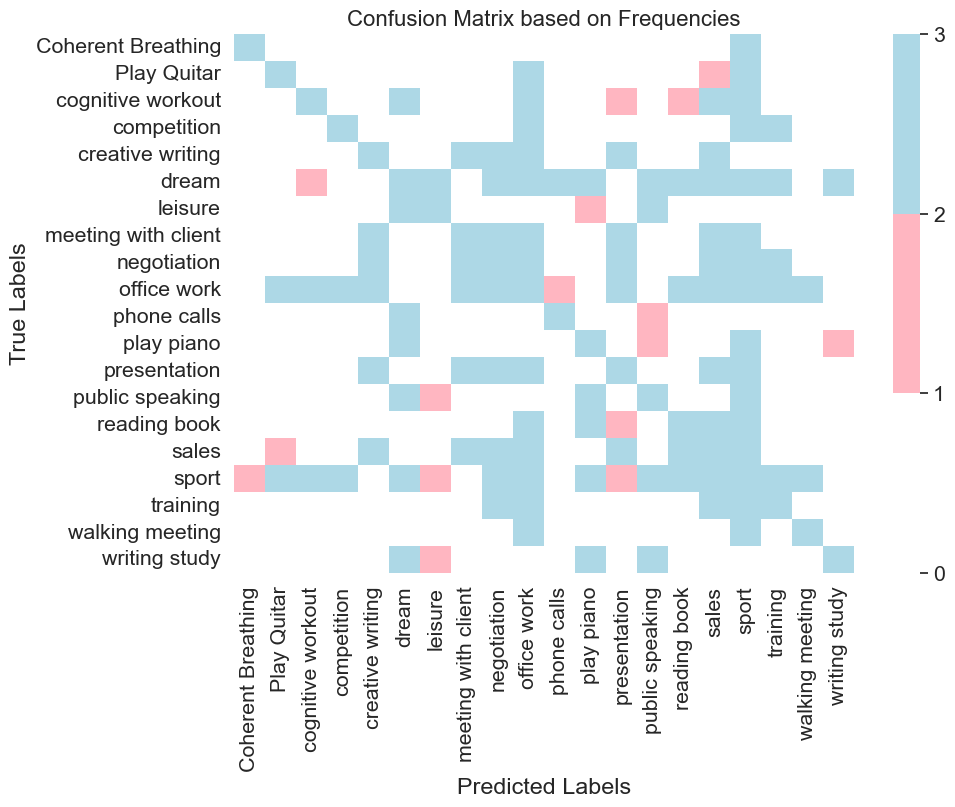

In [85]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.colors as colors

# Define a colormap where zero values are white
cmap = colors.ListedColormap(['white', 'lightpink', 'lightblue'])

# Define the bounds for each color
bounds = [0,1,2,3]

# Create a normalization based on the bounds
norm = colors.BoundaryNorm(bounds, cmap.N)

# Compute the confusion matrix
cm = confusion_matrix(y_test_target, y_test_pred)

# Get sorted labels
labels = sorted(y_test['Activities Detailed'].unique())

# Create the heatmap
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=False, cmap=cmap, norm=norm, xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix based on Frequencies', size=16)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

plt.show()


In [111]:

# Generate a classification report
class_report = classification_report(y_pred_train, y_train_target, output_dict=True)

test_class_report = classification_report(y_test_pred,y_test_target, output_dict=True) 

# Create dataframes
df_test = pd.DataFrame(test_class_report).transpose()
df = pd.DataFrame(class_report).transpose()

# Add suffixes to the column names
df_test.columns = [str(col) + '_Test' for col in df_test.columns]
df.columns = [str(col) for col in df.columns]

# Concatenate the dataframes
result_df = pd.concat([df, df_test], axis=1).reset_index(drop=False).iloc[:-3,:]
macro_df = pd.concat([df, df_test], axis=1).reset_index(drop=False).iloc[-3:,:]

In [114]:
result_df['index'] = result_df['index'].astype(int)

In [115]:
result_df['Label'] = label_encoder.inverse_transform(result_df['index'])

In [116]:
result_df

,index,precision,recall,f1-score,support,precision_Test,recall_Test,f1-score_Test,support_Test,Label
0,0,0.966102,1.000000,0.982759,57.0,0.931034,0.964286,0.947368,28.0,Coherent Breathing
1,1,0.972093,0.933036,0.952164,448.0,0.919811,0.911215,0.915493,214.0,Play Quitar
2,2,0.965937,0.992996,0.979280,1999.0,0.941700,0.980453,0.960685,972.0,cognitive workout
3,3,0.640382,0.967509,0.770669,1662.0,0.575586,0.955705,0.718466,745.0,competition
4,4,0.953045,0.870986,0.910169,3612.0,0.927429,0.849577,0.886798,1775.0,creative writing
5,5,0.991607,0.998301,0.994943,44145.0,0.989127,0.995311,0.992210,21754.0,dream
6,6,0.988189,0.998409,0.993273,1257.0,0.974400,0.991857,0.983051,614.0,leisure
7,7,0.868032,0.863122,0.865570,1768.0,0.804850,0.833732,0.819036,836.0,meeting with client
8,8,0.766078,0.885138,0.821316,4414.0,0.724920,0.840720,0.778538,2166.0,negotiation
9,9,0.956504,0.895023,0.924743,51916.0,0.939861,0.873834,0.905646,25736.0,office work


<Axes: >

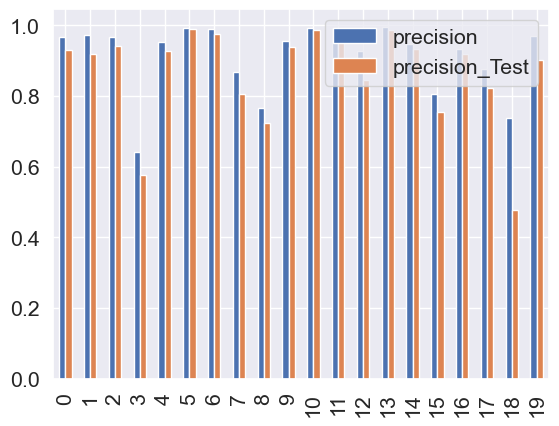

In [97]:
result_df.iloc[:-3,:][['precision','precision_Test']].plot(kind='bar')